# Imports

In [ ]:
import os
import warnings
warnings.simplefilter(action = 'ignore', category=FutureWarning)
warnings.filterwarnings('ignore')
def ignore_warn(*args, **kwargs):
    pass

warnings.warn = ignore_warn

import pandas as pd
import datetime
import math
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib.cm as cm

%matplotlib inline

import seaborn as sns
sns.set(style="ticks", color_codes=True, font_scale=1.5)
color = sns.color_palette()
sns.set_style('darkgrid')

from mpl_toolkits.mplot3d import Axes3D

import plotly as py
import plotly.graph_objs as go
import plotly.offline as py
py.offline.init_notebook_mode()

from scipy import stats
from scipy.stats import skew, norm, probplot, boxcox
from sklearn import preprocessing
import math

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

from sklearn.metrics import pairwise_distances
from itertools import combinations
from sklearn.metrics import davies_bouldin_score

# Loading the dataset

In [ ]:
import pandas as pd
cs_df = pd.read_excel("https://github.com/shreyss99/Customer-Segmentation-and-Market-Basket-Analysis/raw/main/Online%20Retail%202.xlsx")
cs_df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680.0,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.0,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.0,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.0,France


In [ ]:
cs_df_copy = cs_df.copy()

In [ ]:
cs_df[cs_df['Quantity']<=0].shape[0]/cs_df.shape[0]

0.019604767590130447

In [ ]:
cs_df[(cs_df['UnitPrice']<=0)|(cs_df['Quantity']<=0)|(cs_df['CustomerID'].isnull())].shape[0]

144025

In [ ]:
cs_df[cs_df['CustomerID'].isnull()].shape[0]

135080

In [ ]:
cs_df[cs_df['Description'].isnull()].shape[0]

1454

In [ ]:
x = cs_df[~cs_df['CustomerID'].isnull()]
x[x['Description'].isnull()].shape[0]

0

In [ ]:
cs_df[(cs_df['UnitPrice']<=0)|(cs_df['Quantity']<=0)|(cs_df['CustomerID'].isnull())].shape[0]/cs_df.shape[0]

0.26577340475983974

In [ ]:
len(cs_df['InvoiceNo'].unique())

25900

In [ ]:
len(cs_df[cs_df['CustomerID'].isnull()].InvoiceNo.unique())

3710

# Exploratory Data Analysis (EDA)

In [ ]:
cs_df.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country'],
      dtype='object')

In [ ]:
cs_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    541909 non-null  object        
 1   StockCode    541909 non-null  object        
 2   Description  540455 non-null  object        
 3   Quantity     541909 non-null  int64         
 4   InvoiceDate  541909 non-null  datetime64[ns]
 5   UnitPrice    541909 non-null  float64       
 6   CustomerID   406829 non-null  float64       
 7   Country      541909 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 33.1+ MB


In [ ]:
def dataset_structure(df):
    obs = df.shape[0]
    types = df.dtypes
    counts = df.apply(lambda x: x.count())
    uniques = df.apply(lambda x: list(x.unique()))
    nulls = df.apply(lambda x: x.isnull().sum())
    distincts = df.apply(lambda x: x.unique().shape[0])
    missing_ratio = (df.isnull().sum()/ obs) * 100
    skewness = df.skew()
    kurtosis = df.kurt()
    print('Data shape:', df.shape)

    str1 = pd.concat([types, counts, distincts, nulls, missing_ratio, uniques,skewness, kurtosis], axis = 1, sort=True)
    cols = ['types', 'counts', 'distincts', 'nulls', 'missing_ratio', 'uniques','skewness', 'kurtosis' ]
    str1.columns = cols
    dtypes = str1.types.value_counts()
    print('___________________________\nData types:\n',str1.types.value_counts())
    print('___________________________')
    return str1

details = dataset_structure(cs_df)
display(details.sort_values(by='missing_ratio', ascending=False))

Data shape: (397884, 8)
___________________________
Data types:
 object            4
float64           2
datetime64[ns]    1
int64             1
Name: types, dtype: int64
___________________________


,types,counts,distincts,nulls,missing_ratio,uniques,skewness,kurtosis
Country,object,397884,37,0,0.0,"[United Kingdom, France, Australia, Netherland...",NaN,NaN
CustomerID,float64,397884,4338,0,0.0,"[17850.0, 13047.0, 12583.0, 13748.0, 15100.0, ...",0.025729,-1.180822
Description,object,397884,3877,0,0.0,"[WHITE HANGING HEART T-LIGHT HOLDER, WHITE MET...",NaN,NaN
InvoiceDate,datetime64[ns],397884,17282,0,0.0,"[2010-12-01T08:26:00.000000000, 2010-12-01T08:...",NaN,NaN
InvoiceNo,object,397884,18532,0,0.0,"[536365, 536366, 536367, 536368, 536369, 53637...",-0.178524,-1.200748
Quantity,int64,397884,301,0,0.0,"[6, 8, 2, 32, 3, 4, 24, 12, 48, 18, 20, 36, 80...",409.892972,178186.243253
StockCode,object,397884,3665,0,0.0,"[85123A, 71053, 84406B, 84029G, 84029E, 22752,...",NaN,NaN
UnitPrice,float64,397884,440,0,0.0,"[2.55, 3.39, 2.75, 7.65, 4.25, 1.85, 1.69, 2.1...",204.032727,58140.396673


### Description of Columns:

Let's see the description of each column:


*   InvoiceNo: A unique identifier for the invoice. An invoice number shared across rows means that those transactions were performed in a single invoice (multiple purchases).

*   StockCode: Identifier for items contained in an invoice.

*   Description: Textual description of each of the stock item.

*   Quantity: The quantity of the item purchased.

*   InvoiceDate: Date of purchase.

*   UnitPrice: Value of each item.

*   CustomerID: Identifier for customer making the purchase.

*   Country: Country of customer.

In [ ]:
cs_df.describe()

,Quantity,UnitPrice,CustomerID
count,541909.000000,541909.000000,406829.000000
mean,9.552250,4.611114,15287.690570
std,218.081158,96.759853,1713.600303
min,-80995.000000,-11062.060000,12346.000000
25%,1.000000,1.250000,13953.000000
50%,3.000000,2.080000,15152.000000
75%,10.000000,4.130000,16791.000000
max,80995.000000,38970.000000,18287.000000


The output reveals the presence of negative values in both the Quantity and UnitPrice fields, suggesting the potential existence of return transactions in our dataset. To ensure the integrity of our customer segmentation and market basket analysis, it is imperative to identify records where either both values are negative or where one value is negative while the other is zero. Before proceeding with data removal, it is crucial to thoroughly examine these specific scenarios.

In [ ]:
print('Check if we had negative quantity and prices at same register:',
     'No' if cs_df[(cs_df.Quantity<0) & (cs_df.UnitPrice<0)].shape[0] == 0 else 'Yes', '\n')

print('Check how many register we have where quantity is negative and prices is 0 or vice-versa:',
      cs_df[(cs_df.Quantity<=0) & (cs_df.UnitPrice<=0)].shape[0])

print('\nWhat is the customer ID of the registers above:',
      cs_df.loc[(cs_df.Quantity<=0) & (cs_df.UnitPrice<=0), ['CustomerID']].CustomerID.unique())

print('\n% Negative Quantity: {:3.2%}'.format(cs_df[(cs_df.Quantity<0)].shape[0]/cs_df.shape[0]))

print('\nAll register with negative quantity has Invoice start with:',
      cs_df.loc[(cs_df.Quantity<0) & ~(cs_df.CustomerID.isnull()), 'InvoiceNo'].apply(lambda x: x[0]).unique())

print('\nSee an example of negative quantity and others related records:')
display(cs_df[(cs_df.CustomerID==12472) & (cs_df.StockCode==22244)])
print()

print('Check register with UnitPrice negative:')
display(cs_df[(cs_df.UnitPrice<0)])

Check if we had negative quantity and prices at same register: No 

Check how many register we have where quantity is negative and prices is 0 or vice-versa: 1336

What is the customer ID of the registers above: [nan]

% Negative Quantity: 1.96%

All register with negative quantity has Invoice start with: ['C']

See an example of negative quantity and others related records:


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
1973,C536548,22244,3 HOOK HANGER MAGIC GARDEN,-4,2010-12-01 14:33:00,1.95,12472.0,Germany
9438,537201,22244,3 HOOK HANGER MAGIC GARDEN,12,2010-12-05 14:19:00,1.95,12472.0,Germany
121980,546843,22244,3 HOOK HANGER MAGIC GARDEN,12,2011-03-17 12:40:00,1.95,12472.0,Germany



Check register with UnitPrice negative:


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
299983,A563186,B,Adjust bad debt,1,2011-08-12 14:51:00,-11062.06,NaN,United Kingdom
299984,A563187,B,Adjust bad debt,1,2011-08-12 14:52:00,-11062.06,NaN,United Kingdom


In [ ]:
print("Sales records with Customer ID and zero in Unit Price:",cs_df[(cs_df.UnitPrice==0)  & ~(cs_df.CustomerID.isnull())].shape[0])
cs_df[(cs_df.UnitPrice==0)  & ~(cs_df.CustomerID.isnull())]

Sales records with Customer ID and zero in Unit Price: 40


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
9302,537197,22841,ROUND CAKE TIN VINTAGE GREEN,1,2010-12-05 14:02:00,0.0,12647.0,Germany
33576,539263,22580,ADVENT CALENDAR GINGHAM SACK,4,2010-12-16 14:36:00,0.0,16560.0,United Kingdom
40089,539722,22423,REGENCY CAKESTAND 3 TIER,10,2010-12-21 13:45:00,0.0,14911.0,EIRE
47068,540372,22090,PAPER BUNTING RETROSPOT,24,2011-01-06 16:41:00,0.0,13081.0,United Kingdom
47070,540372,22553,PLASTERS IN TIN SKULLS,24,2011-01-06 16:41:00,0.0,13081.0,United Kingdom
56674,541109,22168,ORGANISER WOOD ANTIQUE WHITE,1,2011-01-13 15:10:00,0.0,15107.0,United Kingdom
86789,543599,84535B,FAIRY CAKES NOTEBOOK A6 SIZE,16,2011-02-10 13:08:00,0.0,17560.0,United Kingdom
130188,547417,22062,CERAMIC BOWL WITH LOVE HEART DESIGN,36,2011-03-23 10:25:00,0.0,13239.0,United Kingdom
139453,548318,22055,MINI CAKE STAND HANGING STRAWBERY,5,2011-03-30 12:45:00,0.0,13113.0,United Kingdom
145208,548871,22162,HEART GARLAND RUSTIC PADDED,2,2011-04-04 14:42:00,0.0,14410.0,United Kingdom


As you can see, there are no records where quantity and price are negative, but there are 1.336 records where one of them is and the other is 0. However, note that for all these records we do not have the customer ID. So we conclude that we can erase all records in that quantity or the price and negative. In addition, by the foregoing summary we see that there are 135,080 records without customer identification that we may also disregard.

In [ ]:
# Remove register withou CustomerID
cs_df = cs_df[~(cs_df.CustomerID.isnull())]

# Remove negative or return transactions
cs_df = cs_df[~(cs_df.Quantity<0)]
cs_df = cs_df[cs_df.UnitPrice>0]

details = dataset_structure(cs_df)
display(details.sort_values(by='distincts', ascending=False))

Data shape: (397884, 8)
___________________________
Data types:
 object            4
float64           2
datetime64[ns]    1
int64             1
Name: types, dtype: int64
___________________________


,types,counts,distincts,nulls,missing_ratio,uniques,skewness,kurtosis
InvoiceNo,object,397884,18532,0,0.0,"[536365, 536366, 536367, 536368, 536369, 53637...",-0.178524,-1.200748
InvoiceDate,datetime64[ns],397884,17282,0,0.0,"[2010-12-01T08:26:00.000000000, 2010-12-01T08:...",NaN,NaN
CustomerID,float64,397884,4338,0,0.0,"[17850.0, 13047.0, 12583.0, 13748.0, 15100.0, ...",0.025729,-1.180822
Description,object,397884,3877,0,0.0,"[WHITE HANGING HEART T-LIGHT HOLDER, WHITE MET...",NaN,NaN
StockCode,object,397884,3665,0,0.0,"[85123A, 71053, 84406B, 84029G, 84029E, 22752,...",NaN,NaN
UnitPrice,float64,397884,440,0,0.0,"[2.55, 3.39, 2.75, 7.65, 4.25, 1.85, 1.69, 2.1...",204.032727,58140.396673
Quantity,int64,397884,301,0,0.0,"[6, 8, 2, 32, 3, 4, 24, 12, 48, 18, 20, 36, 80...",409.892972,178186.243253
Country,object,397884,37,0,0.0,"[United Kingdom, France, Australia, Netherland...",NaN,NaN


After this first cleanup, note that we still have more description than inventory codes, so we still have some inconsistency on the basis that requires further investigation. Let´s see it:

In [ ]:
cat_des_df = cs_df.groupby(["StockCode","Description"]).count().reset_index()
display(cat_des_df.StockCode.value_counts()[cat_des_df.StockCode.value_counts()>1].reset_index().head())
cs_df[cs_df['StockCode'] == cat_des_df.StockCode.value_counts()[cat_des_df.StockCode.value_counts()>1]
      .reset_index()['index'][4]]['Description'].unique()

,index,StockCode
0,23196,4
1,23236,4
2,23203,3
3,17107D,3
4,23535,3


array(['BICYCLE SAFTEY WALL ART', 'WALL ART BICYCLE SAFTEY ',
       'WALL ART BICYCLE SAFETY'], dtype=object)

### Correcting descriptions with errors

In our dataset, we observe that we have some items that have the same decription type. But these descriptions are erroneous due to spelling inconsistencies. Hence we need to replace them with a single description. So, we calculate the mode of the description and use that obtained mode value as the final description for all the erroneous descriptions.

In [ ]:
unique_desc = cs_df[['StockCode','Description']].groupby("StockCode").apply(pd.DataFrame.mode).reset_index(drop=True)

In [ ]:
cs_df = pd.merge(unique_desc,cs_df,on="StockCode",how="inner")

In [ ]:
cs_df.head()

,StockCode,Description_x,InvoiceNo,Description_y,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,10002,INFLATABLE POLITICAL GLOBE,536370,INFLATABLE POLITICAL GLOBE,48,2010-12-01 08:45:00,0.85,12583.0,France
1,10002,INFLATABLE POLITICAL GLOBE,536382,INFLATABLE POLITICAL GLOBE,12,2010-12-01 09:45:00,0.85,16098.0,United Kingdom
2,10002,INFLATABLE POLITICAL GLOBE,536863,INFLATABLE POLITICAL GLOBE,1,2010-12-03 11:19:00,0.85,17967.0,United Kingdom
3,10002,INFLATABLE POLITICAL GLOBE,537047,INFLATABLE POLITICAL GLOBE,1,2010-12-05 11:02:00,0.85,13069.0,United Kingdom
4,10002,INFLATABLE POLITICAL GLOBE,537227,INFLATABLE POLITICAL GLOBE,24,2010-12-06 08:42:00,0.85,17677.0,United Kingdom


In [ ]:
cs_df.drop(columns=['Description_y'], inplace=True)

In [ ]:
cs_df.head()

,StockCode,Description_x,InvoiceNo,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,10002,INFLATABLE POLITICAL GLOBE,536370,48,2010-12-01 08:45:00,0.85,12583.0,France
1,10002,INFLATABLE POLITICAL GLOBE,536382,12,2010-12-01 09:45:00,0.85,16098.0,United Kingdom
2,10002,INFLATABLE POLITICAL GLOBE,536863,1,2010-12-03 11:19:00,0.85,17967.0,United Kingdom
3,10002,INFLATABLE POLITICAL GLOBE,537047,1,2010-12-05 11:02:00,0.85,13069.0,United Kingdom
4,10002,INFLATABLE POLITICAL GLOBE,537227,24,2010-12-06 08:42:00,0.85,17677.0,United Kingdom


In [ ]:
cs_df.rename(columns={'Description_x': 'Description'}, inplace=True)
cs_df.shape

(397884, 8)

### Correcting data types for CustomerID and InvoiceNo columns to integers

* Creating a new column 'Amount' as product of UnitPrice and Quantity

In [ ]:
cs_df.InvoiceDate = pd.to_datetime(cs_df.InvoiceDate)
cs_df['Amount'] = cs_df.Quantity*cs_df.UnitPrice
cs_df.CustomerID = cs_df.CustomerID.astype('int64')
cs_df.InvoiceNo = cs_df.InvoiceNo.astype('int64')

details = dataset_structure(cs_df)
display(details.sort_values(by='distincts', ascending=False))

Data shape: (397884, 9)
___________________________
Data types:
 object            3
int64             3
float64           2
datetime64[ns]    1
Name: types, dtype: int64
___________________________


,types,counts,distincts,nulls,missing_ratio,uniques,skewness,kurtosis
InvoiceNo,int64,397884,18532,0,0.0,"[536365, 536366, 536367, 536368, 536369, 53637...",-0.178524,-1.200748
InvoiceDate,datetime64[ns],397884,17282,0,0.0,"[2010-12-01T08:26:00.000000000, 2010-12-01T08:...",NaN,NaN
CustomerID,int64,397884,4338,0,0.0,"[17850, 13047, 12583, 13748, 15100, 15291, 146...",0.025729,-1.180822
Description,object,397884,3877,0,0.0,"[WHITE HANGING HEART T-LIGHT HOLDER, WHITE MET...",NaN,NaN
StockCode,object,397884,3665,0,0.0,"[85123A, 71053, 84406B, 84029G, 84029E, 22752,...",NaN,NaN
Amount,float64,397884,2939,0,0.0,"[15.299999999999999, 20.34, 22.0, 15.3, 25.5, ...",451.443182,232155.117219
UnitPrice,float64,397884,440,0,0.0,"[2.55, 3.39, 2.75, 7.65, 4.25, 1.85, 1.69, 2.1...",204.032727,58140.396673
Quantity,int64,397884,301,0,0.0,"[6, 8, 2, 32, 3, 4, 24, 12, 48, 18, 20, 36, 80...",409.892972,178186.243253
Country,object,397884,37,0,0.0,"[United Kingdom, France, Australia, Netherland...",NaN,NaN


In [ ]:
cat_des_df = cs_df.groupby(["StockCode","Description"]).count().reset_index()
display(cat_des_df.StockCode.value_counts()[cat_des_df.StockCode.value_counts()>1].reset_index().head())
cs_df[cs_df['StockCode'] == cat_des_df.StockCode.value_counts()[cat_des_df.StockCode.value_counts()>1]
      .reset_index()['index'][4]]['Description'].unique()

,index,StockCode
0,23196,4
1,23236,4
2,23203,3
3,17107D,3
4,23535,3


array(['BICYCLE SAFTEY WALL ART', 'WALL ART BICYCLE SAFTEY ',
       'WALL ART BICYCLE SAFETY'], dtype=object)

### Plot for Amount Generated by the Retail Store by Country

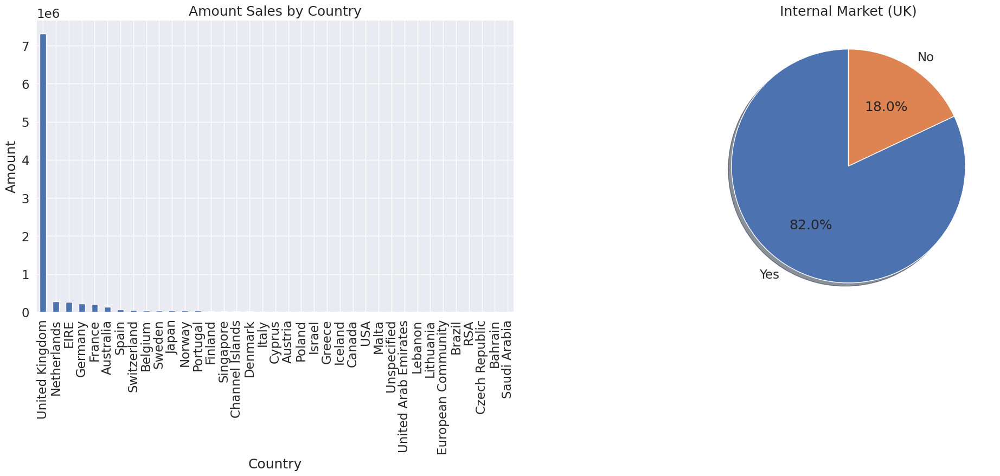

In [ ]:
fig = plt.figure(figsize=(25, 7))
f1 = fig.add_subplot(121)
g = cs_df.groupby(["Country"]).Amount.sum().sort_values(ascending=False).plot(kind='bar', title='Amount Sales by Country')
g.set_ylabel("Amount")

cs_df['Internal'] = cs_df.Country.apply(lambda x: 'Yes' if x == 'United Kingdom' else 'No')
f2 = fig.add_subplot(122)
market = cs_df.groupby(["Internal"]).Amount.sum().sort_values(ascending = False)
g = plt.pie(market, labels=market.index, autopct='%1.1f%%', shadow=True, startangle=90)
plt.title('Internal Market (UK)')
plt.show()

### Plot for:



*   Top Customers
*   Top 10 Customers (17.26% of Amount Sales)
*   Top 10 Customers (8.93% of Events Sales)



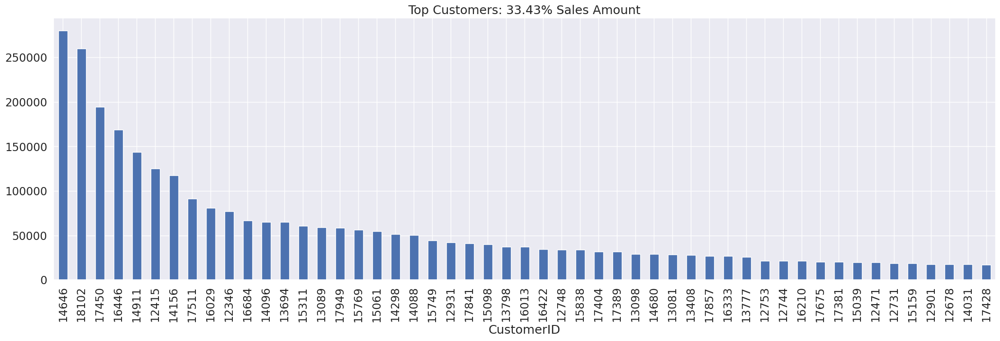

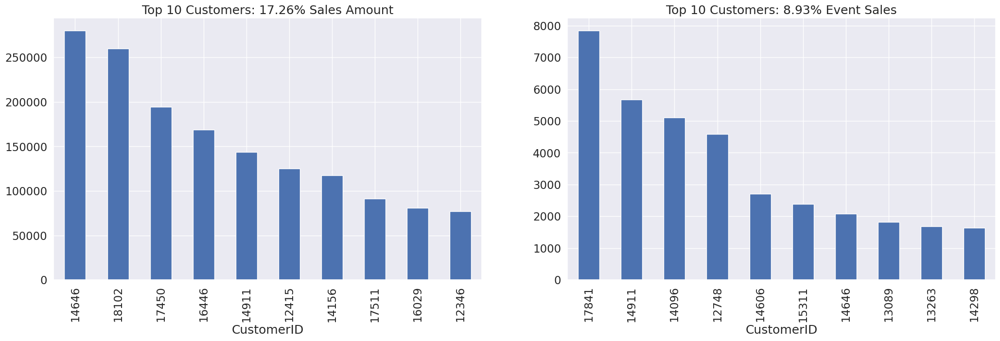

In [ ]:
fig = plt.figure(figsize=(25, 7))
PercentSales =  np.round((cs_df.groupby(["CustomerID"]).Amount.sum().\
                          sort_values(ascending = False)[:51].sum()/cs_df.groupby(["CustomerID"]).\
                          Amount.sum().sort_values(ascending = False).sum()) * 100, 2)
g = cs_df.groupby(["CustomerID"]).Amount.sum().sort_values(ascending = False)[:51].\
    plot(kind='bar', title='Top Customers: {:3.2f}% Sales Amount'.format(PercentSales))

fig = plt.figure(figsize=(25, 7))
f1 = fig.add_subplot(121)
PercentSales =  np.round((cs_df.groupby(["CustomerID"]).Amount.sum().\
                          sort_values(ascending = False)[:10].sum()/cs_df.groupby(["CustomerID"]).\
                          Amount.sum().sort_values(ascending = False).sum()) * 100, 2)
g = cs_df.groupby(["CustomerID"]).Amount.sum().sort_values(ascending = False)[:10]\
    .plot(kind='bar', title='Top 10 Customers: {:3.2f}% Sales Amount'.format(PercentSales))
f1 = fig.add_subplot(122)
PercentSales =  np.round((cs_df.groupby(["CustomerID"]).Amount.count().\
                          sort_values(ascending = False)[:10].sum()/cs_df.groupby(["CustomerID"]).\
                          Amount.count().sort_values(ascending = False).sum()) * 100, 2)
g = cs_df.groupby(["CustomerID"]).Amount.count().sort_values(ascending = False)[:10].\
    plot(kind='bar', title='Top 10 Customers: {:3.2f}% Event Sales'.format(PercentSales))

### Plot for:



*   Top 10 Products in Sales Amount
*   Events of Top 10 most sold Products
*   Sales Amount of Top 15 most sold Products



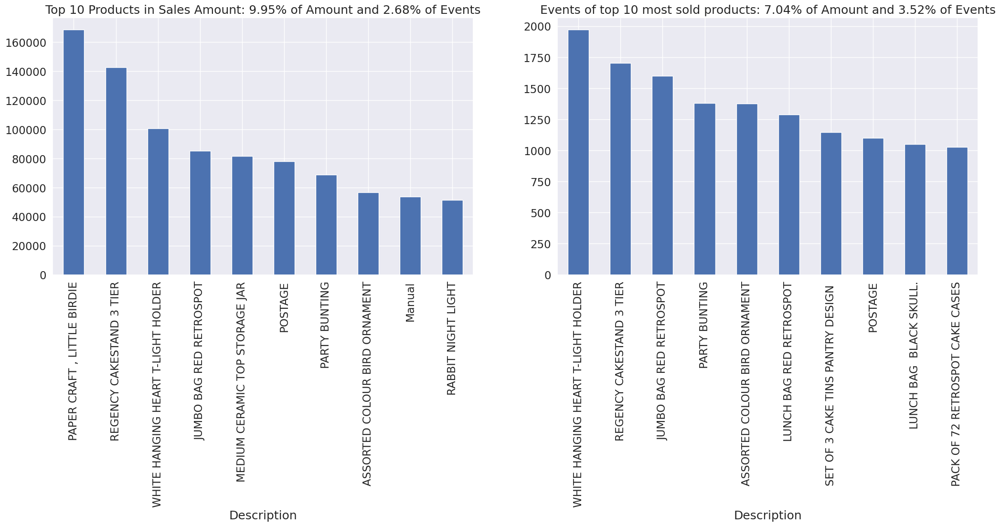

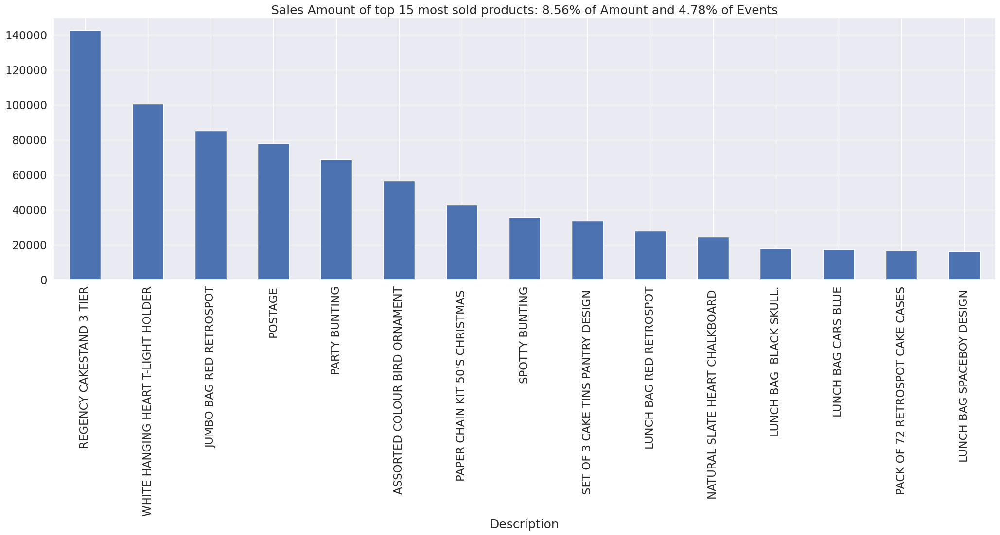

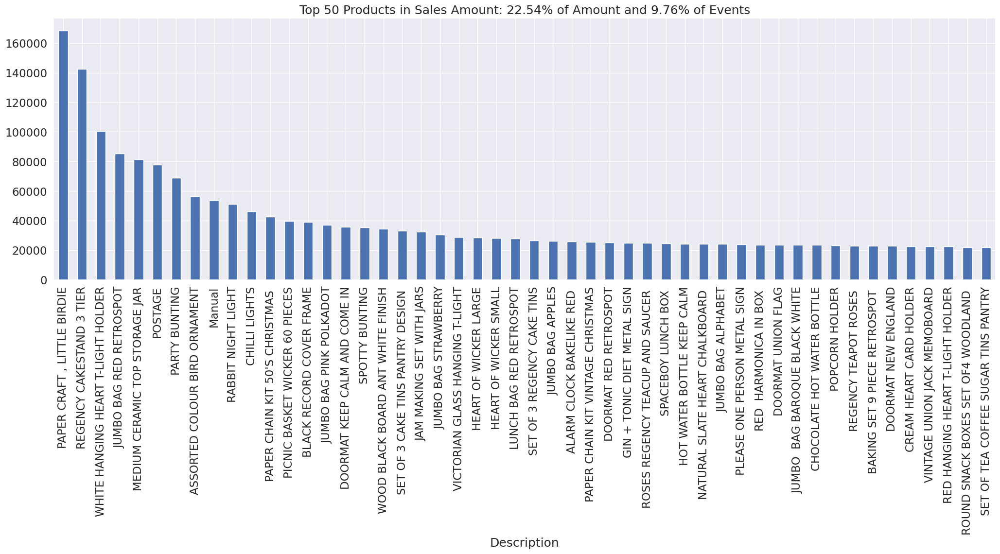

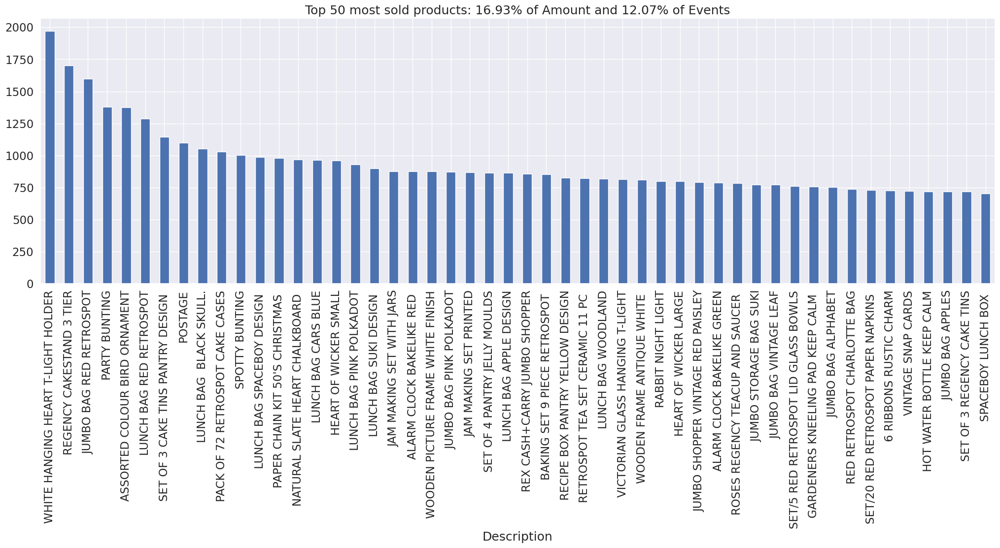

In [ ]:
AmoutSum = cs_df.groupby(["Description"]).Amount.sum().sort_values(ascending = False)
inv = cs_df[["Description", "InvoiceNo"]].groupby(["Description"]).InvoiceNo.unique().\
      agg(np.size).sort_values(ascending = False)

fig = plt.figure(figsize=(25, 7))
f1 = fig.add_subplot(121)
Top10 = list(AmoutSum[:10].index)
PercentSales =  np.round((AmoutSum[Top10].sum()/AmoutSum.sum()) * 100, 2)
PercentEvents = np.round((inv[Top10].sum()/inv.sum()) * 100, 2)
g = AmoutSum[Top10].\
    plot(kind='bar', title='Top 10 Products in Sales Amount: {:3.2f}% of Amount and {:3.2f}% of Events'.\
                       format(PercentSales, PercentEvents))

f1 = fig.add_subplot(122)
Top10Ev = list(inv[:10].index)
PercentSales =  np.round((AmoutSum[Top10Ev].sum()/AmoutSum.sum()) * 100, 2)
PercentEvents = np.round((inv[Top10Ev].sum()/inv.sum()) * 100, 2)
g = inv[Top10Ev].\
    plot(kind='bar', title='Events of top 10 most sold products: {:3.2f}% of Amount and {:3.2f}% of Events'.\
                       format(PercentSales, PercentEvents))


fig = plt.figure(figsize=(25, 7))
Top15ev = list(inv[:15].index)
PercentSales =  np.round((AmoutSum[Top15ev].sum()/AmoutSum.sum()) * 100, 2)
PercentEvents = np.round((inv[Top15ev].sum()/inv.sum()) * 100, 2)
g = AmoutSum[Top15ev].sort_values(ascending = False).\
    plot(kind='bar',
         title='Sales Amount of top 15 most sold products: {:3.2f}% of Amount and {:3.2f}% of Events'.\
         format(PercentSales, PercentEvents))

fig = plt.figure(figsize=(25, 7))
Top50 = list(AmoutSum[:50].index)
PercentSales =  np.round((AmoutSum[Top50].sum()/AmoutSum.sum()) * 100, 2)
PercentEvents = np.round((inv[Top50].sum()/inv.sum()) * 100, 2)
g = AmoutSum[Top50].\
    plot(kind='bar',
         title='Top 50 Products in Sales Amount: {:3.2f}% of Amount and {:3.2f}% of Events'.\
         format(PercentSales, PercentEvents))

fig = plt.figure(figsize=(25, 7))
Top50Ev = list(inv[:50].index)
PercentSales =  np.round((AmoutSum[Top50Ev].sum()/AmoutSum.sum()) * 100, 2)
PercentEvents = np.round((inv[Top50Ev].sum()/inv.sum()) * 100, 2)
g = inv[Top50Ev].\
    plot(kind='bar', title='Top 50 most sold products: {:3.2f}% of Amount and {:3.2f}% of Events'.\
                       format(PercentSales, PercentEvents))

In [ ]:
cs_df_filtered = cs_df[cs_df.UnitPrice<4000]
dataset_structure(cs_df_filtered)

Data shape: (397881, 10)
___________________________
Data types:
 object            4
int64             3
float64           2
datetime64[ns]    1
Name: types, dtype: int64
___________________________


,types,counts,distincts,nulls,missing_ratio,uniques,skewness,kurtosis
Amount,float64,397881,2937,0,0.0,"[15.299999999999999, 20.34, 22.0, 15.3, 25.5, ...",453.175070,233381.143937
Country,object,397881,37,0,0.0,"[United Kingdom, France, Australia, Netherland...",NaN,NaN
CustomerID,int64,397881,4338,0,0.0,"[17850, 13047, 12583, 13748, 15100, 15291, 146...",0.025729,-1.180821
Description,object,397881,3877,0,0.0,"[WHITE HANGING HEART T-LIGHT HOLDER, WHITE MET...",NaN,NaN
Internal,object,397881,2,0,0.0,"[Yes, No]",NaN,NaN
InvoiceDate,datetime64[ns],397881,17280,0,0.0,"[2010-12-01T08:26:00.000000000, 2010-12-01T08:...",NaN,NaN
InvoiceNo,int64,397881,18529,0,0.0,"[536365, 536366, 536367, 536368, 536369, 53637...",-0.178519,-1.200748
Quantity,int64,397881,301,0,0.0,"[6, 8, 2, 32, 3, 4, 24, 12, 48, 18, 20, 36, 80...",409.891446,178184.910925
StockCode,object,397881,3665,0,0.0,"[85123A, 71053, 84406B, 84029G, 84029E, 22752,...",NaN,NaN
UnitPrice,float64,397881,438,0,0.0,"[2.55, 3.39, 2.75, 7.65, 4.25, 1.85, 1.69, 2.1...",134.711450,24095.492919


In [ ]:
x = cs_df.groupby("Description")['StockCode'].count().to_frame().reset_index().sort_values(by="StockCode",ascending=False).head(60)

In [ ]:
unique_stockcode_counts = cs_df.groupby('Description')['StockCode'].nunique().reset_index()

# unique_stockcode_counts now contains two columns: 'Description' and 'StockCodeCount'
unique_stockcode_counts.sort_values(by="StockCode",ascending=False).head(20)

,Description,StockCode
2014,"METAL SIGN,CUPCAKE SINGLE HOOK",3
2471,PINK FLOWERS RABBIT EASTER,2
1077,EAU DE NILE JEWELLED PHOTOFRAME,2
2460,PINK FAIRY CAKE CUSHION COVER,2
3678,WHITE BAMBOO RIBS LAMPSHADE,2
826,COLOURING PENCILS BROWN TUBE,2
828,COLUMBIAN CANDLE RECTANGLE,2
2796,RETRO PLASTIC POLKA TRAY,2
829,COLUMBIAN CANDLE ROUND,2
2794,RETRO PLASTIC DAISY TRAY,2


In [ ]:
cs_df[cs_df['Description']=="EAU DE NILE JEWELLED PHOTOFRAME"]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Amount,Internal
37504,539469,85023B,EAU DE NILE JEWELLED PHOTOFRAME,1,2010-12-19 13:59:00,2.55,17841,United Kingdom,2.55,Yes
63636,541587,85023B,EAU DE NILE JEWELLED PHOTOFRAME,1,2011-01-19 14:39:00,2.55,17841,United Kingdom,2.55,Yes
75983,542617,85024B,EAU DE NILE JEWELLED PHOTOFRAME,3,2011-01-30 15:48:00,1.65,17463,United Kingdom,4.95,Yes
83573,543332,85024B,EAU DE NILE JEWELLED PHOTOFRAME,12,2011-02-07 12:24:00,1.65,13955,United Kingdom,19.80,Yes
122040,546849,85023B,EAU DE NILE JEWELLED PHOTOFRAME,1,2011-03-17 13:13:00,2.55,13623,United Kingdom,2.55,Yes
171269,551399,85024B,EAU DE NILE JEWELLED PHOTOFRAME,2,2011-04-28 13:17:00,1.65,17874,United Kingdom,3.30,Yes
200854,554160,85024B,EAU DE NILE JEWELLED PHOTOFRAME,2,2011-05-23 11:49:00,1.65,17841,United Kingdom,3.30,Yes
245614,558620,85023B,EAU DE NILE JEWELLED PHOTOFRAME,1,2011-06-30 16:39:00,2.55,15584,United Kingdom,2.55,Yes
245621,558620,85024B,EAU DE NILE JEWELLED PHOTOFRAME,1,2011-06-30 16:39:00,1.65,15584,United Kingdom,1.65,Yes
258110,559552,85024B,EAU DE NILE JEWELLED PHOTOFRAME,1,2011-07-10 16:29:00,1.65,16014,United Kingdom,1.65,Yes


# Customer Segmentation:

Customer segmentation is the process of categorizing an organization's customer base into distinct sections or segments based on various customer attributes. This segmentation relies on identifying variations in customer behavior and patterns.

The primary objectives and advantages motivating customer segmentation include:

* **Higher Revenue**: The fundamental goal of any customer segmentation project is to enhance revenue generation.

* **Customer Understanding**: "Know your customer" is a widely accepted business paradigm, and segmentation allows for a comprehensive analysis of customer characteristics.

* **Target Marketing**:  Customer segmentation facilitates effective and efficient marketing efforts. By understanding different segments within the customer base, organizations can tailor marketing campaigns to specific segments, increasing the likelihood of campaign success.

* **Optimal Product Placement**: A well-defined segmentation strategy aids in the development and offering of new products or bundled product offerings.

* **Finding Latent Customer Segments**: Customer segmentation helps in identifying previously unrecognized customer segments, allowing organizations to focus on targeted marketing campaigns and new business development.

**Clustering**:
An effective method for customer segmentation involves using unsupervised machine learning techniques such as clustering. This entails collecting customer data in the form of various features and attributes, identifying clusters within the data, and analyzing the traits of customer segments based on cluster characteristics.

**Exploratory Data Analysis**:
Exploratory data analysis, conducted by analysts with domain expertise, is another approach to identifying customer segments. This flexible method includes analyzing key decision points in an analysis relevant to both products and customers.

### RFM Model for Customer Value:
Since our dataset is limited to the sales records, and didn´t include anothers information about our customers, we will use a **RFM**,***Recency, Frequency and Monetary Value**, based model of customer value for finding our customer segments.
 The RFM model will take the transactions of a customer and calculate three important informational attributes about each customer:
- **Recency**: The value of how recently a customer purchased at the store.
- **Frequency**: How frequent the customer’s transactions are at the store.
- **Monetary value**: The dollar (or pounds in our case) value of all the transactions that the customer made at the store.

#### Recency
To establish the recency feature variable, we must determine the reference date for our analysis. Typically, we opt for the last transaction date plus one day. Subsequently, we construct the recency variable, representing the number of days before the reference date since the customer's last purchase.

In [ ]:
reference_date = cs_df.InvoiceDate.max() + datetime.timedelta(days = 1)
print('Reference Date:', reference_date)
cs_df['days_since_last_purchase'] = (reference_date - cs_df.InvoiceDate).astype('timedelta64[D]')
customer_history_df =  cs_df[['CustomerID', 'days_since_last_purchase']].groupby("CustomerID").min().reset_index()
customer_history_df.rename(columns={'days_since_last_purchase':'recency'}, inplace=True)
customer_history_df.describe().transpose()

Reference Date: 2011-12-10 12:50:00


,count,mean,std,min,25%,50%,75%,max
CustomerID,4338.0,15300.408022,1721.808492,12346.0,13813.25,15299.5,16778.75,18287.0
recency,4338.0,92.536422,100.014169,1.0,18.00,51.0,142.00,374.0


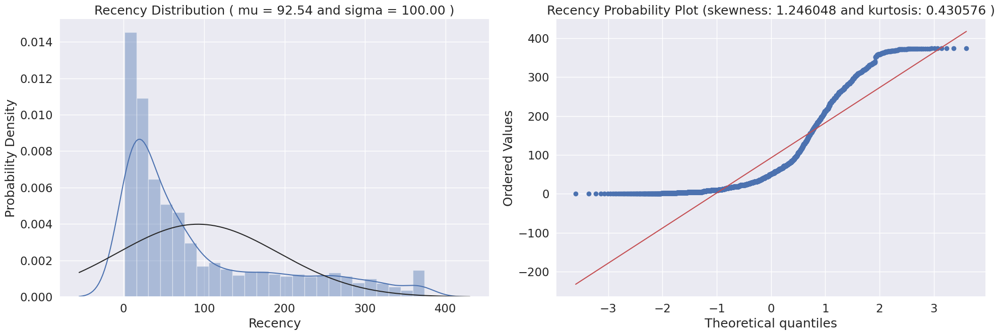

In [ ]:
def QQ_plot(data, measure):
    fig = plt.figure(figsize=(20,7))

    #Get the fitted parameters used by the function
    (mu, sigma) = norm.fit(data)

    #Kernel Density plot
    fig1 = fig.add_subplot(121)
    sns.distplot(data, fit=norm)
    fig1.set_title(measure + ' Distribution ( mu = {:.2f} and sigma = {:.2f} )'.format(mu, sigma), loc='center')
    fig1.set_xlabel(measure)
    fig1.set_ylabel('Probability Density')

    #QQ plot
    fig2 = fig.add_subplot(122)
    res = probplot(data, plot=fig2)
    fig2.set_title(measure + ' Probability Plot (skewness: {:.6f} and kurtosis: {:.6f} )'.format(data.skew(), data.kurt()), loc='center')

    plt.tight_layout()
    plt.show()

QQ_plot(customer_history_df.recency, 'Recency')

The initial graph indicates that the distribution of sales recency is **skewed**, displaying a peak on the left and an extended tail on the right. This distribution **diverges from a normal distribution** and exhibits a **positive bias**.

Examining the Probability Plot further reinforces that **sales recency does not align with the diagonal red line** representing a normal distribution. The visual representation of the distribution affirms its right-skewed nature.

With a **positive skewness value of 1.25**, it confirms the asymmetry, indicating that sales recency is skewed to the right, as evident in the Sales Distribution plot. Right skewness implies that the **right tail of the distribution is longer relative to the left tail**. In contrast, a normal distribution has a skewness close to zero, and symmetric data displays a skewness near zero.

Kurtosis, a measure of tail heaviness relative to a normal distribution, reveals that sales recency, with a **positive kurtosis of 0.43, is heavy-tailed**. High kurtosis suggests the presence of outliers, and positive kurtosis indicates a **heavy-tailed distribution**, while negative kurtosis indicates a light-tailed distribution. Therefore, the positive kurtosis value suggests that sales recency has a heavy-tailed distribution and includes some outliers.

#### Frequency

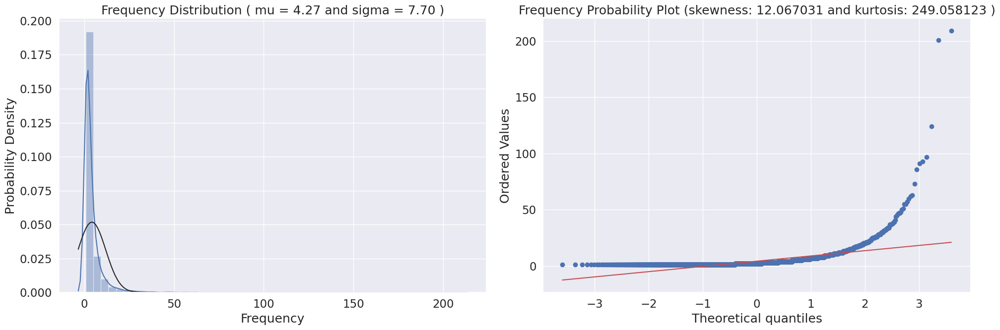

In [ ]:
customer_freq = (cs_df[['CustomerID', 'InvoiceNo']].groupby(["CustomerID", 'InvoiceNo']).count().reset_index()).\
                groupby(["CustomerID"]).count().reset_index()
customer_freq.rename(columns={'InvoiceNo':'frequency'},inplace=True)
customer_history_df = customer_history_df.merge(customer_freq)
QQ_plot(customer_history_df.frequency, 'Frequency')

From the first graph above we can see that sales frequency distribution is **skewed**, has a **peak on the left and a long tail to the right**. It deviates from normal distribution and is **positively biased**.

From the Probability Plot, we could see that sales frequency also does **not align with the diagonal and confirm that is a skewed right**.

With **skewness positive of 12.1**, we confirm the high lack of symmetry and with **249 Kurtosis** indicates that is a **heavy-tailed distribution and has outliers**.

#### Monetary Value

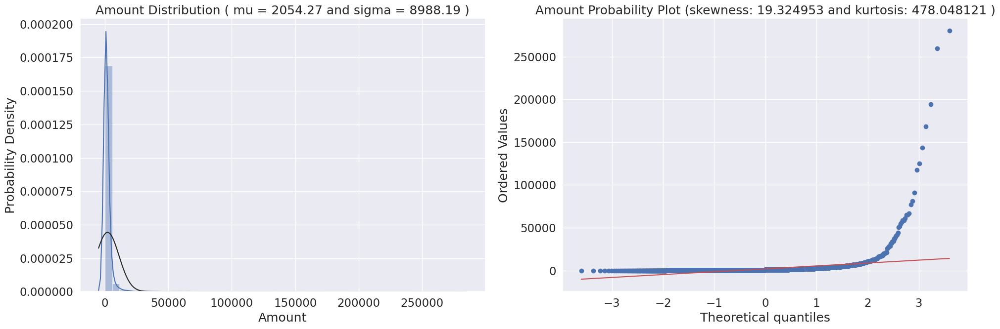

In [ ]:
customer_monetary_val = cs_df[['CustomerID', 'Amount']].groupby("CustomerID").sum().reset_index()
customer_history_df = customer_history_df.merge(customer_monetary_val)
QQ_plot(customer_history_df.Amount, 'Amount')

From the first graph above we can see that sales amount distribution is **skewed**, has a **peak on the left and a long tail to the right**. It deviates from normal distribution and is **positively biased**.

From the Probability Plot, we could see that sales amount also **does not align with the diagonal, special on the right**.

With **skewness positive of 19.3**, we confirm the high lack of symmetry and with **478 Kurtosis** indicates that is a too **heavy-tailed distribution** and has outliers, surely more than 10 very extreme.

#### Descriptive Statistics of Customer History Data

In [ ]:
customer_history_df.describe()

,CustomerID,recency,frequency,Amount
count,4338.000000,4338.000000,4338.000000,4338.000000
mean,15300.408022,92.536422,4.272015,2054.266460
std,1721.808492,100.014169,7.697998,8989.230441
min,12346.000000,1.000000,1.000000,3.750000
25%,13813.250000,18.000000,1.000000,307.415000
50%,15299.500000,51.000000,2.000000,674.485000
75%,16778.750000,142.000000,5.000000,1661.740000
max,18287.000000,374.000000,209.000000,280206.020000


### Data Preprocessing

After constructing our customer value dataset, we initiate preprocessing steps to prepare the data for clustering using the K-means algorithm. A crucial requirement for the algorithm's optimal performance is mean centering of variable values. This involves replacing the actual variable values with standardized ones, resulting in a mean of 0 and variance of 1. This standardization ensures uniformity among variable ranges, preventing disparities from impacting algorithm performance—a process similar to feature scaling.

Another issue to address is the extensive range of values, notably observed in the monetary amount variable. To mitigate this, we opt for a log transformation of all variables. This transformation, combined with standardization, ensures that our algorithm receives a consistent set of scaled and transformed values.

It's worth noting that the data preprocessing step should be reversible at times. In our case, the clustering results are presented in terms of log-transformed and scaled variables. To draw inferences in the context of the original data, a reverse transformation is necessary. Utilizing Python's preprocessing capabilities facilitates the seamless restoration of the original RFM figures from the transformed and scaled variables.

In [ ]:
customer_history_df['recency_log'] = customer_history_df['recency'].apply(math.log)
customer_history_df['frequency_log'] = customer_history_df['frequency'].apply(math.log)
customer_history_df['Amount_log'] = customer_history_df['Amount'].apply(math.log)
feature_vector = ['Amount_log', 'recency_log','frequency_log']
X_subset = customer_history_df[feature_vector] #.as_matrix()
scaler = preprocessing.StandardScaler().fit(X_subset)
X_scaled = scaler.transform(X_subset)
pd.DataFrame(X_scaled, columns=X_subset.columns).describe().T

,count,mean,std,min,25%,50%,75%,max
Amount_log,4338.0,-7.010426e-16,1.000115,-4.179280,-0.684183,-0.060942,0.654244,4.721395
recency_log,4338.0,-1.048288e-16,1.000115,-2.630445,-0.612424,0.114707,0.829652,1.505796
frequency_log,4338.0,-9.991495e-17,1.000115,-1.048610,-1.048610,-0.279044,0.738267,4.882714


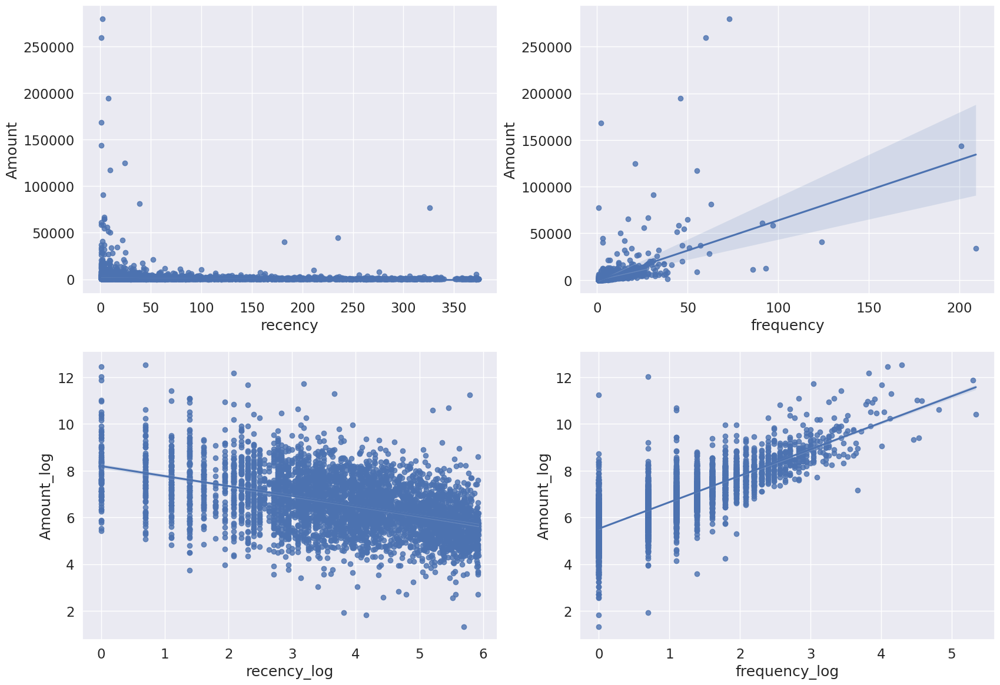

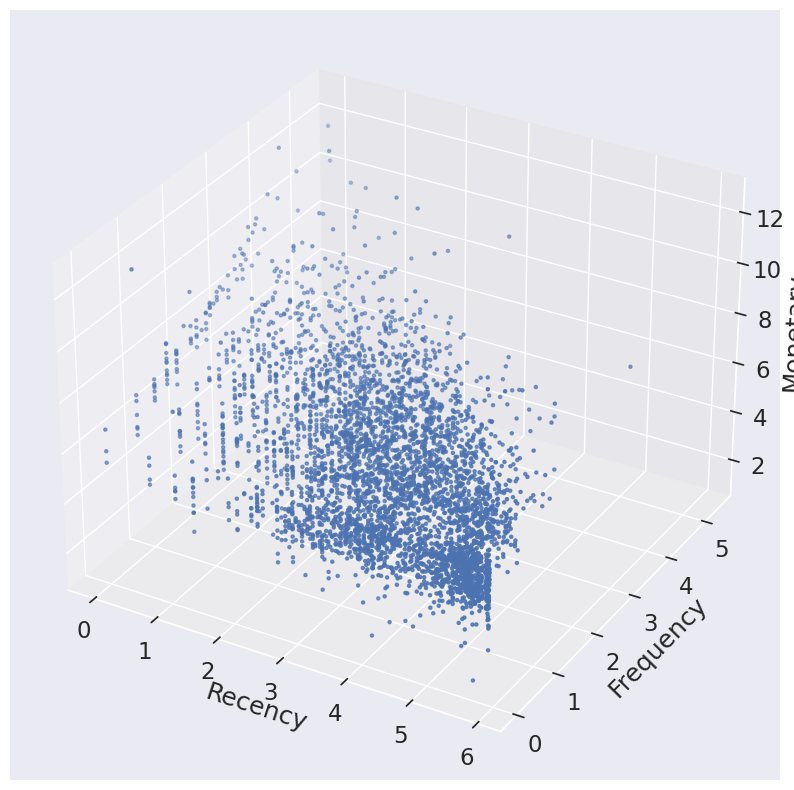

In [ ]:
fig = plt.figure(figsize=(20,14))
f1 = fig.add_subplot(221); sns.regplot(x='recency', y='Amount', data=customer_history_df)
f1 = fig.add_subplot(222); sns.regplot(x='frequency', y='Amount', data=customer_history_df)
f1 = fig.add_subplot(223); sns.regplot(x='recency_log', y='Amount_log', data=customer_history_df)
f1 = fig.add_subplot(224); sns.regplot(x='frequency_log', y='Amount_log', data=customer_history_df)

fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(111, projection='3d')

xs =customer_history_df.recency_log
ys = customer_history_df.frequency_log
zs = customer_history_df.Amount_log
ax.scatter(xs, ys, zs, s=5)

ax.set_xlabel('Recency')
ax.set_ylabel('Frequency')
ax.set_zlabel('Monetary')

plt.show()

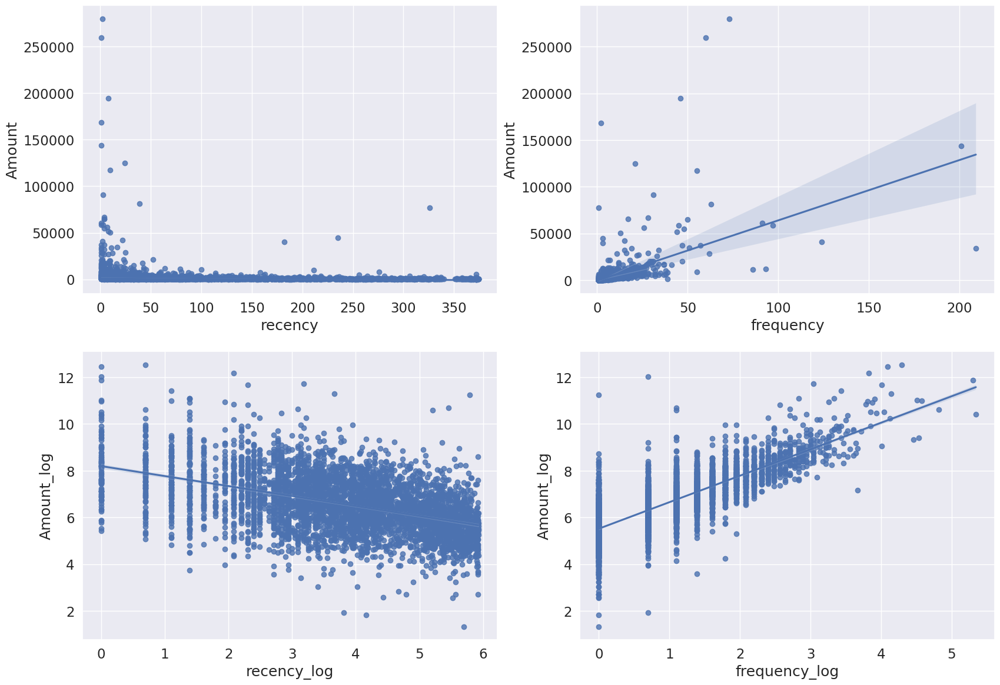

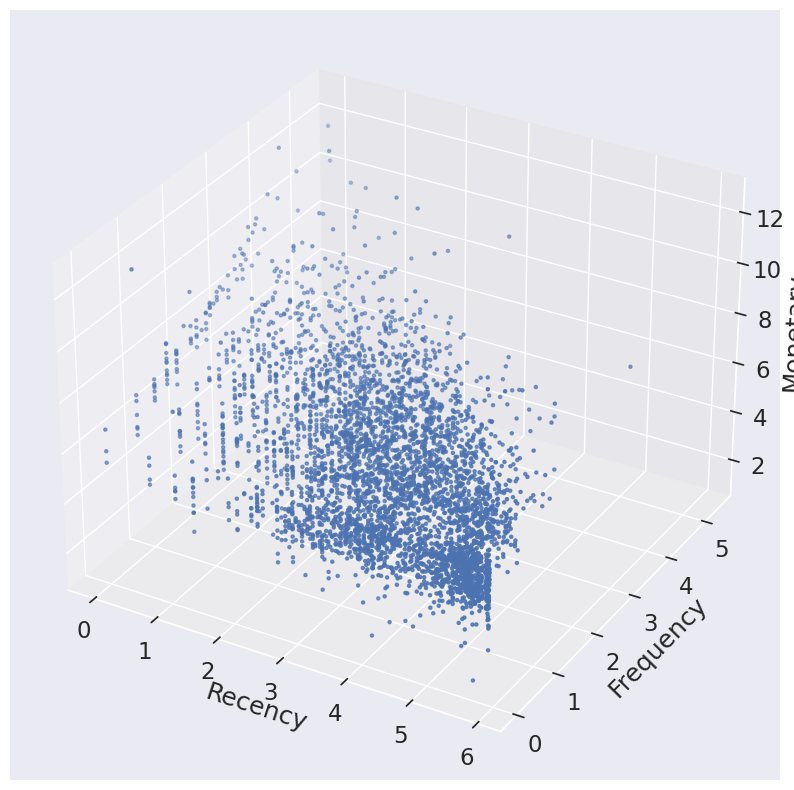

In [ ]:
fig = plt.figure(figsize=(20,14))
f1 = fig.add_subplot(221); sns.regplot(x='recency', y='Amount', data=customer_history_df)
f1 = fig.add_subplot(222); sns.regplot(x='frequency', y='Amount', data=customer_history_df)
f1 = fig.add_subplot(223); sns.regplot(x='recency_log', y='Amount_log', data=customer_history_df)
f1 = fig.add_subplot(224); sns.regplot(x='frequency_log', y='Amount_log', data=customer_history_df)

fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(111, projection='3d')

xs =customer_history_df.recency_log
ys = customer_history_df.frequency_log
zs = customer_history_df.Amount_log
ax.scatter(xs, ys, zs, s=5)

ax.set_xlabel('Recency')
ax.set_ylabel('Frequency')
ax.set_zlabel('Monetary')

plt.show()

The obvious patterns we can see from the plots above is that costumers who buy with a higher frequency and more recency tend to spend more based on the increasing trend in Monetary (amount value) with a corresponding increasing and decreasing trend for Frequency and Recency, respectively.

### Clustering for Segments
#### K-Means Clustering
The K-means clustering belongs to the partition based\centroid based hard clustering family of algorithms, a family of algorithms where each sample in a dataset is assigned to exactly one cluster.

Based on this Euclidean distance metric, we can describe the k-means algorithm as a simple optimization problem, an iterative approach for minimizing the within-cluster sum of squared errors (SSE), which is sometimes also called cluster inertia. So, the objective of K-Means clustering is to minimize total intra-cluster variance, or, the squared error function:
![image](https://www.saedsayad.com/images/Clustering_kmeans_c.png)

The steps that happen in the K-means algorithm for partitioning the data are as given follows:
1. The algorithm starts with random point initializations of the required number of centers. The “K” in K-means stands for the number of clusters.
2. In the next step, each of the data point is assigned to the center closest to it. The distance metric used in K-means clustering is normal Euclidian distance.
3. Once the data points are assigned, the centers are recalculated by averaging the dimensions of the points belonging to the cluster.
4. The process is repeated with new centers until we reach a point where the assignments become stable. In this case, the algorithm terminates.

##### K-means++
- Place the initial centroids far away from each other via the k-means++ algorithm, which leads to better and more consistent results than the classic k-means.
- To use k-means++ with scikit-learn's KMeans object, we just need to set the init parameter to k-means++ (the default setting) instead of random.

#### The Elbow Method
  
Using the elbow method to find the optimal number of clusters. The idea behind the elbow method is to identify the value of k where the distortion begins to increase most rapidly. If k increases, the distortion will decrease, because the samples will be closer to the centroids they are assigned to.

This method looks at the percentage of variance explained as a function of the number of clusters. More precisely, if one plots the percentage of variance explained by the clusters against the number of clusters, the first clusters will add much information (explain a lot of variance), but at some point the marginal gain will drop, giving an angle in the graph. The number of clusters is chosen at this point, hence the "elbow criterion". This "elbow" cannot always be unambiguously identified.Percentage of variance explained is the ratio of the between-group variance to the total variance, also known as an F-test. A slight variation of this method plots the curvature of the within group variance.

### K-Means++ Clustering

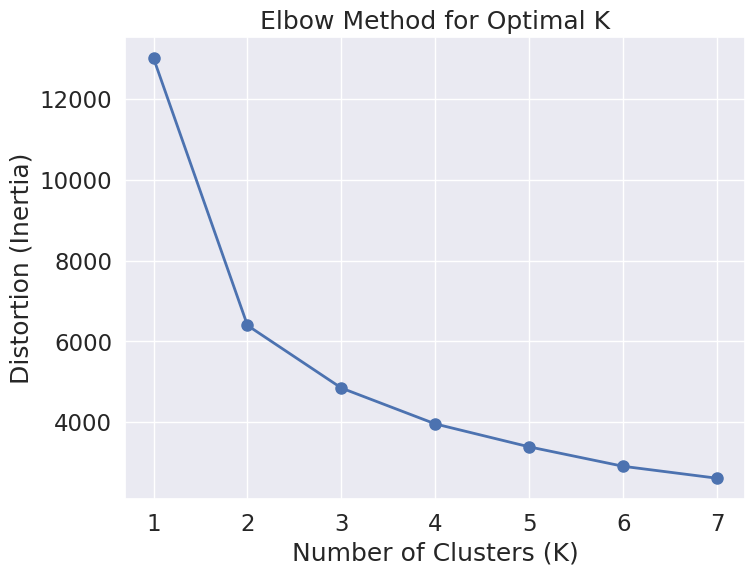

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Assuming X_scaled is your 2D array

# Calculate distortion (inertia) for different values of K
distortions = []
K_range = range(1, 8)  # You can adjust the range of K values as needed

for k in K_range:
    kmeans = KMeans(n_clusters=k, init='k-means++', n_init=10, max_iter=300, random_state=101)
    kmeans.fit(X_scaled)
    distortions.append(kmeans.inertia_)

# Plot the elbow graph
plt.figure(figsize=(8, 6))
plt.plot(K_range, distortions, marker='o', color='b', linestyle='-', linewidth=2, markersize=8)
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Distortion (Inertia)')
plt.title('Elbow Method for Optimal K')
plt.grid(True)
plt.show()

# Determine the optimal K value (elbow point)
optimal_k = K_range[distortions.index(min(distortions))]


#### Silhouette analysis on K-Means clustering

Silhouette analysis can be used to study the separation distance between the resulting clusters, as a strategy to quantifying the quality of clustering via graphical tool to plot a measure of how tightly grouped the samples in the clusters are. The silhouette plot displays a measure of how close each point in one cluster is to points in the neighboring clusters and thus provides a way to assess parameters like number of clusters visually.

It can also be applied to clustering algorithms other than k-means

Silhouette coefficients has a range of \[-1, 1\], it calculated by:
1. Calculate the cluster cohesion a( i )as the average distance between a sample x( i )   and all other points in the same cluster.
2. Calculate the cluster separation b( i ) from the next closest cluster as the average distance between the sample x( i ) and all samples in the nearest cluster.
3. Calculate the silhouette s( i )  as the difference between cluster cohesion and separation divided by the greater of the two, as shown here:
![image](https://wikimedia.org/api/rest_v1/media/math/render/svg/3d80ab22fb291b347b2d9dc3cc7cd614f6b15479)
Which can be also written as:
![image](https://wikimedia.org/api/rest_v1/media/math/render/svg/ab5579a6c7150579af8a0d432b6630ba529376f0)

Where:
- If near +1, it indicate that the sample is far away from the neighboring clusters.
- a high value indicates that the object is well matched to its own cluster and poorly matched to neighboring clusters.
- If most objects have a high value, then the clustering configuration is appropriate.
- If many points have a low or negative value, then the clustering configuration may have too many or too few clusters.
- A value of 0 indicates that the sample is on or very close to the decision boundary between two neighboring clusters
- Negative values indicate that those samples might have been assigned to the wrong cluster.

The silhouette plot can shows a bad K clusters pick for the given data due to the presence of clusters with below average silhouette scores and also due to wide fluctuations in the size of the silhouette plots. A good k clusters can found when all the plots are more or less of similar thickness and hence are of similar sizes.

Although we have to keep in mind that in several cases and scenarios, sometimes we may have to drop the mathematical explanation given by the algorithm and look at the business relevance of the results obtained.

Let's see below how our data perform for each K clusters groups (3, 5 and 7) in the silhouette score of each cluster, along with the center of each of the cluster discovered in the scatter plots, by amount_log vs recency_log and vs frequency_log.

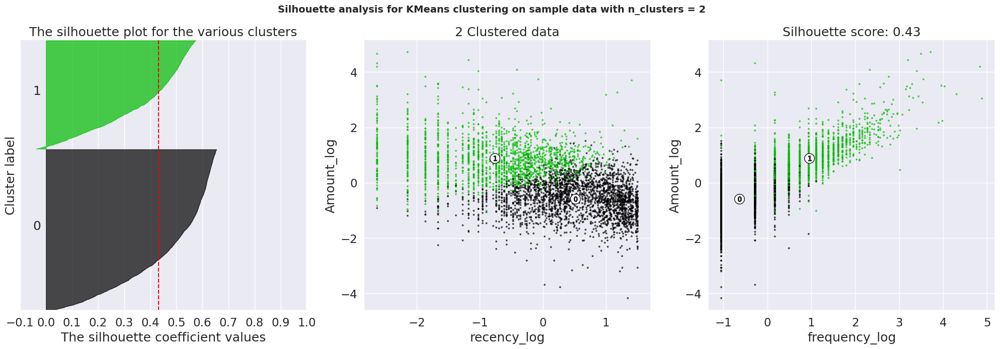

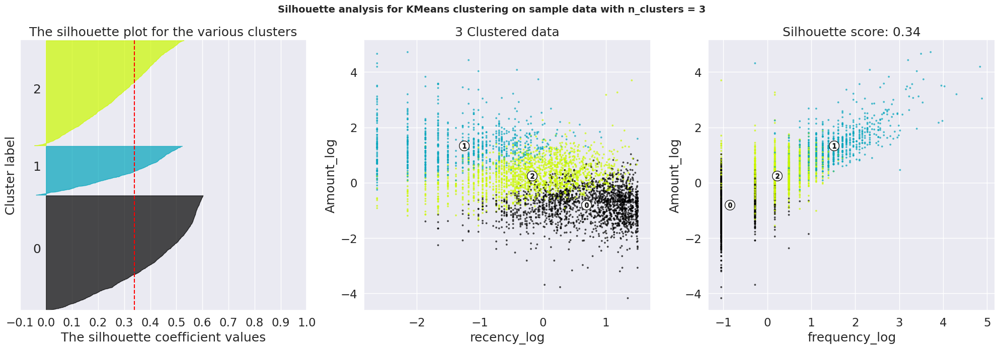

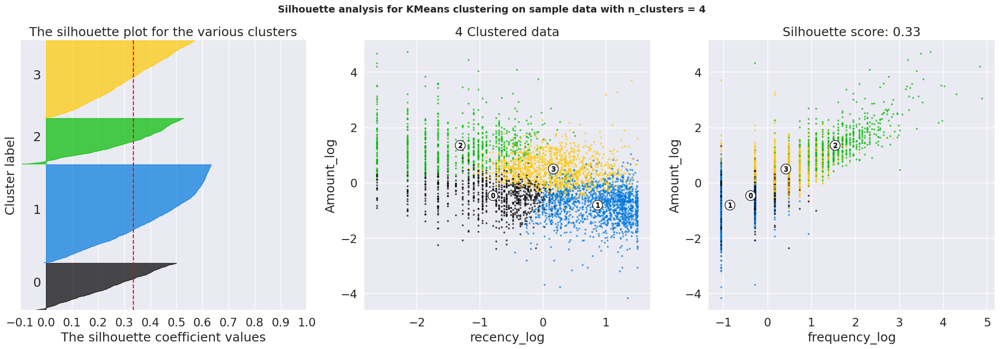

In [ ]:
cluster_centers = dict()
dunn_indices = []
db_indices = []

for n_clusters in range(2,5,1):
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
    fig.set_size_inches(25, 7)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(X_scaled) + (n_clusters + 1) * 10])

    clusterer = KMeans(n_clusters=n_clusters, init='k-means++', n_init=10,max_iter=300, tol=1e-04, random_state=101)
    cluster_labels = clusterer.fit_predict(X_scaled)

    silhouette_avg = silhouette_score(X = X_scaled, labels = cluster_labels)
    # Calculate Dunn Index
    cluster_distances = []
    for i in range(n_clusters):
        cluster_i_points = X_scaled[cluster_labels == i]
        pairwise_dist = pairwise_distances(cluster_i_points)
        within_cluster_dist = np.mean(pairwise_dist[np.triu_indices(len(pairwise_dist), k=1)])
        cluster_distances.append(within_cluster_dist)

    max_within_cluster_dist = max(cluster_distances)
    min_between_cluster_dist = min([np.linalg.norm(c1 - c2) for c1, c2 in combinations(clusterer.cluster_centers_, 2)])
    dunn_index = min_between_cluster_dist / max_within_cluster_dist

    dunn_indices.append(dunn_index)

    db_index = davies_bouldin_score(X_scaled, cluster_labels)
    db_indices.append(db_index)

    cluster_centers.update({n_clusters :{'cluster_center':clusterer.cluster_centers_,
                                         'silhouette_score':silhouette_avg,
                                         'labels':cluster_labels}
                           })

    sample_silhouette_values = silhouette_samples(X = X_scaled, labels = cluster_labels)
    y_lower = 10
    for i in range(n_clusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
    ax1.set_yticks([])
    ax1.set_xticks([-0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1])
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)

    centers = clusterer.cluster_centers_
    y = 0
    x = 1
    ax2.scatter(X_scaled[:, x], X_scaled[:, y], marker='.', s=30, lw=0, alpha=0.7, c=colors, edgecolor='k')
    ax2.scatter(centers[:, x], centers[:, y], marker='o', c="white", alpha=1, s=200, edgecolor='k')
    for i, c in enumerate(centers):
        ax2.scatter(c[x], c[y], marker='$%d$' % i, alpha=1, s=50, edgecolor='k')
    ax2.set_title("{} Clustered data".format(n_clusters))
    ax2.set_xlabel(feature_vector[x])
    ax2.set_ylabel(feature_vector[y])

    x = 2
    ax3.scatter(X_scaled[:, x], X_scaled[:, y], marker='.', s=30, lw=0, alpha=0.7, c=colors, edgecolor='k')
    ax3.scatter(centers[:, x], centers[:, y], marker='o', c="white", alpha=1, s=200, edgecolor='k')
    for i, c in enumerate(centers):
        ax3.scatter(c[x], c[y], marker='$%d$' % i, alpha=1, s=50, edgecolor='k')
    ax3.set_title("Silhouette score: {:1.2f}".format(cluster_centers[n_clusters]['silhouette_score']))
    ax3.set_xlabel(feature_vector[x])
    ax3.set_ylabel(feature_vector[y])

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    plt.show()


### DBSCAN Clustering

Silhouette Score: 0.30164183082010243
Dunn Index: 0.0


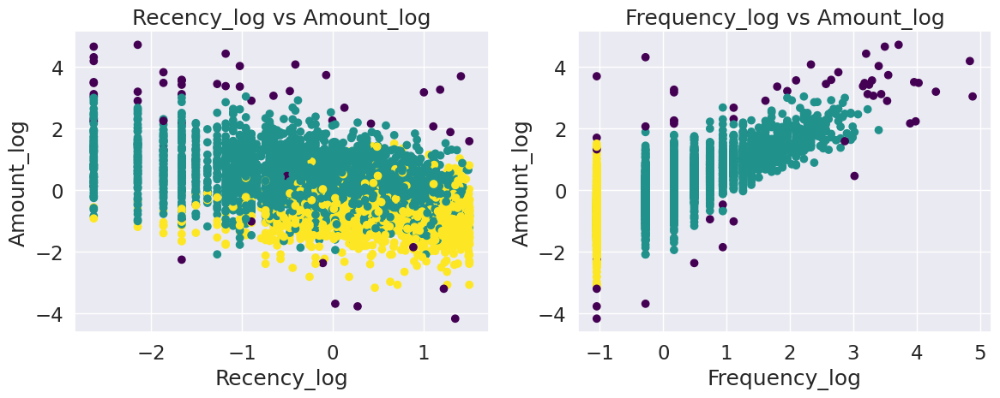

In [ ]:
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt

# Assuming X_scaled is a NumPy array with three features (amount, recency, frequency)
# Ensure that X_scaled is properly standardized if needed
# You may use StandardScaler for that

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_scaled)

# Choose appropriate values for epsilon (eps) and min_samples
eps = 0.5
min_samples = 5

# Apply DBSCAN
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
labels = dbscan.fit_predict(X_scaled)

# Calculate silhouette score
silhouette_avg = silhouette_score(X_scaled, labels)
print(f"Silhouette Score: {silhouette_avg}")

# Calculate Dunn index
def dunn_index(X, labels):
    """
    Calculate the Dunn index for DBSCAN clustering.

    Parameters:
    - X: Data matrix (numpy array).
    - labels: Cluster labels.

    Returns:
    - Dunn index value.
    """
    neighbors = NearestNeighbors(n_neighbors=2)
    neighbors.fit(X)
    distances = neighbors.kneighbors(X)[0]

    max_intra_cluster_distance = np.max([np.max(distances[labels == label]) for label in set(labels)])
    min_inter_cluster_distance = np.min(distances[labels != -1])

    return min_inter_cluster_distance / max_intra_cluster_distance

dunn_index_value = dunn_index(X_scaled, labels)
print(f"Dunn Index: {dunn_index_value}")

# Visualize the clusters
plt.figure(figsize=(12, 5))

# Plot recency_log vs amount_log
plt.subplot(1, 2, 1)
plt.scatter(X_scaled[:, 1], X_scaled[:, 0], c=labels, cmap='viridis', marker='o')
plt.title('Recency_log vs Amount_log')
plt.xlabel('Recency_log')
plt.ylabel('Amount_log')

# Plot frequency_log vs amount_log
plt.subplot(1, 2, 2)
plt.scatter(X_scaled[:, 2], X_scaled[:, 0], c=labels, cmap='viridis', marker='o')
plt.title('Frequency_log vs Amount_log')
plt.xlabel('Frequency_log')
plt.ylabel('Amount_log')

plt.tight_layout()
plt.show()


In [ ]:
pip install kneed

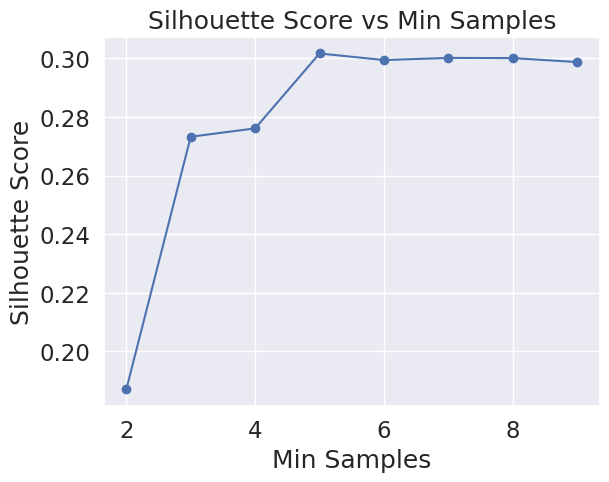

In [ ]:
from sklearn.metrics import silhouette_score
silhouette_scores = []
min_samples_values = range(2, 10)  # adjust the range as needed

for min_samples_value in min_samples_values:
    dbscan = DBSCAN(eps=eps, min_samples=min_samples_value)
    labels = dbscan.fit_predict(X_scaled)
    silhouette_avg = silhouette_score(X_scaled, labels)
    silhouette_scores.append(silhouette_avg)

# Plot silhouette scores for different min_samples values
plt.plot(min_samples_values, silhouette_scores, marker='o')
plt.xlabel('Min Samples')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs Min Samples')
plt.show()

Silhouette Score: 0.30164183082010243
Optimal Eps: 0.5341001782216275
Optimal Number of Clusters: 2


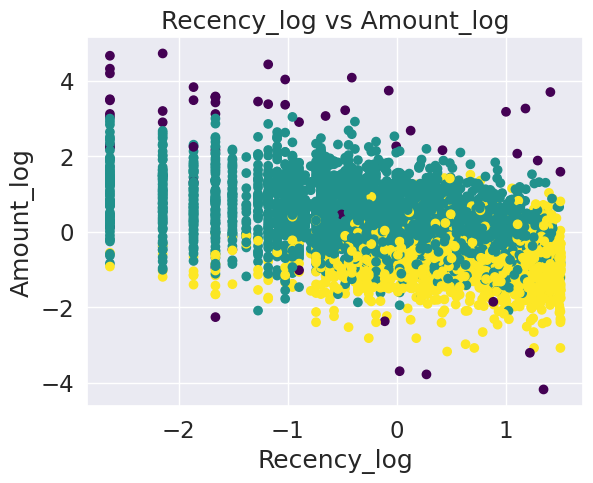

In [ ]:
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors
from kneed import KneeLocator
import matplotlib.pyplot as plt

# Assuming X_scaled is a NumPy array with three features (amount, recency, frequency)
# Ensure that X_scaled is properly standardized if needed
# You may use StandardScaler for that

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_scaled)

# Choose appropriate values for epsilon (eps) and min_samples
eps = 0.5
min_samples = 5

# Apply DBSCAN
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
labels = dbscan.fit_predict(X_scaled)

# Calculate silhouette score
silhouette_avg = silhouette_score(X_scaled, labels)
print(f"Silhouette Score: {silhouette_avg}")

# Calculate the knee in the k-distance graph for optimal number of clusters
neighbors = NearestNeighbors(n_neighbors=2)
neighbors_fit = neighbors.fit(X_scaled)
distances, _ = neighbors_fit.kneighbors(X_scaled)
distances = np.sort(distances[:, 1])

# Find the knee in the k-distance graph
knee_locator = KneeLocator(range(len(distances)), distances, curve='convex', direction='increasing')
optimal_eps = distances[knee_locator.knee]
optimal_num_clusters = len(set(labels)) - 1  # subtract 1 for the noise cluster

print(f"Optimal Eps: {optimal_eps}")
print(f"Optimal Number of Clusters: {optimal_num_clusters}")

# Visualize the clusters
plt.scatter(X_scaled[:, 1], X_scaled[:, 0], c=labels, cmap='viridis', marker='o')
plt.title('Recency_log vs Amount_log')
plt.xlabel('Recency_log')
plt.ylabel('Amount_log')
plt.show()


Silhouette Score: 0.30164183082010243
Optimal Eps: 0.5341001782216275
Optimal Number of Clusters: 2


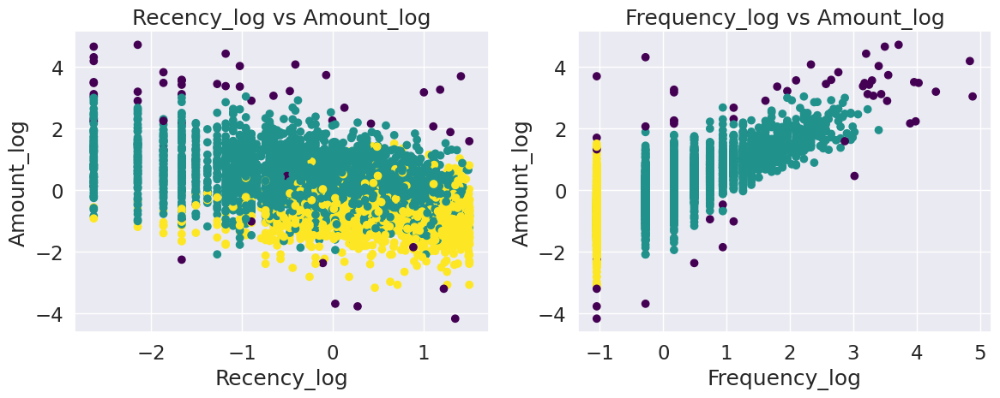

In [ ]:
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors
from kneed import KneeLocator
import matplotlib.pyplot as plt

# Assuming X_scaled is a NumPy array with three features (amount, recency, frequency)
# Ensure that X_scaled is properly standardized if needed
# You may use StandardScaler for that

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_scaled)

# Choose appropriate values for epsilon (eps) and min_samples
#eps = 0.5
min_samples = 5

# Apply DBSCAN
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
labels = dbscan.fit_predict(X_scaled)

# Calculate silhouette score
silhouette_avg = silhouette_score(X_scaled, labels)
print(f"Silhouette Score: {silhouette_avg}")

# Calculate the knee in the k-distance graph for optimal number of clusters
neighbors = NearestNeighbors(n_neighbors=2)
neighbors_fit = neighbors.fit(X_scaled)
distances, _ = neighbors_fit.kneighbors(X_scaled)
distances = np.sort(distances[:, 1])

# Find the knee in the k-distance graph
knee_locator = KneeLocator(range(len(distances)), distances, curve='convex', direction='increasing')
optimal_eps = distances[knee_locator.knee]
optimal_num_clusters = len(set(labels)) - 1  # subtract 1 for the noise cluster

print(f"Optimal Eps: {optimal_eps}")
print(f"Optimal Number of Clusters: {optimal_num_clusters}")

# Visualize the clusters (Recency_log vs Amount_log)
plt.figure(figsize=(12, 5))

# Plot recency_log vs amount_log
plt.subplot(1, 2, 1)
plt.scatter(X_scaled[:, 1], X_scaled[:, 0], c=labels, cmap='viridis', marker='o')
plt.title('Recency_log vs Amount_log')
plt.xlabel('Recency_log')
plt.ylabel('Amount_log')

# Plot frequency_log vs amount_log
plt.subplot(1, 2, 2)
plt.scatter(X_scaled[:, 2], X_scaled[:, 0], c=labels, cmap='viridis', marker='o')
plt.title('Frequency_log vs Amount_log')
plt.xlabel('Frequency_log')
plt.ylabel('Amount_log')

plt.tight_layout()
plt.show()


## Agglomerative Clustering

In [ ]:
from sklearn.cluster import AgglomerativeClustering

## Hierarchical Clustering
## Agglomerative - Ward Linkage

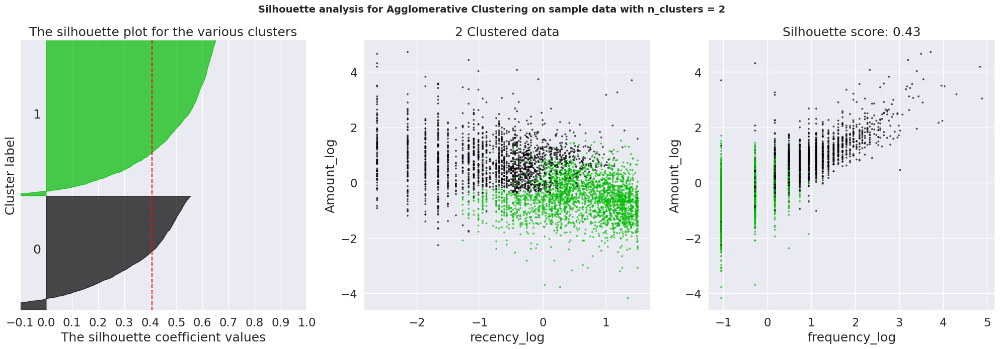

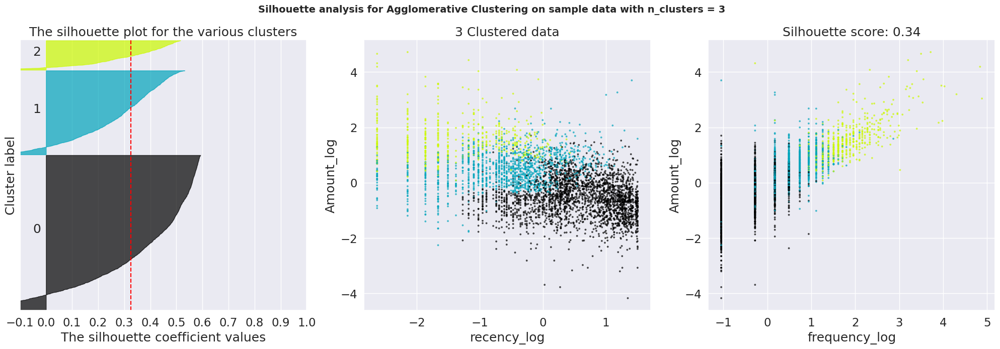

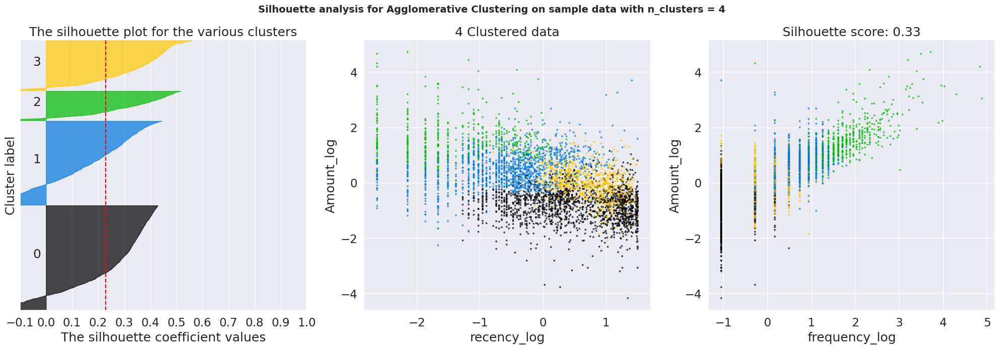

In [ ]:
cluster_centers_agg = dict()
dunn_indices_agg = []

for n_clusters in range(2, 5, 1):
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
    fig.set_size_inches(25, 7)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(X_scaled) + (n_clusters + 1) * 10])

    # Agglomerative Clustering instead of KMeans
    model_agg = AgglomerativeClustering(n_clusters=n_clusters, affinity='euclidean', linkage='ward')
    cluster_labels = model_agg.fit_predict(X_scaled)

    silhouette_avg = silhouette_score(X=X_scaled, labels=cluster_labels)

    # Calculate Dunn Index
    cluster_distances = []
    for i in range(n_clusters):
        cluster_i_points = X_scaled[cluster_labels == i]
        pairwise_dist = pairwise_distances(cluster_i_points)
        within_cluster_dist = np.mean(pairwise_dist[np.triu_indices(len(pairwise_dist), k=1)])
        cluster_distances.append(within_cluster_dist)

    max_within_cluster_dist = max(cluster_distances)
    min_between_cluster_dist = min([np.linalg.norm(c1 - c2) for c1, c2 in combinations(model_agg.children_, 2)])
    dunn_index = min_between_cluster_dist / max_within_cluster_dist

    dunn_indices_agg.append(dunn_index)

    cluster_centers_agg.update({n_clusters: {'cluster_center': None,  # Agglomerative clustering does not have explicit cluster centers
                                         'silhouette_score': silhouette_avg,
                                         'labels': cluster_labels}
                           })

    sample_silhouette_values = silhouette_samples(X=X_scaled, labels=cluster_labels)
    y_lower = 10
    for i in range(n_clusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = plt.cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10

    ax1.set_title("The silhouette plot for the various clusters")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
    ax1.set_yticks([])
    ax1.set_xticks([-0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1])

    colors = plt.cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)

    y = 0
    x = 1
    ax2.scatter(X_scaled[:, x], X_scaled[:, y], marker='.', s=30, lw=0, alpha=0.7, c=colors, edgecolor='k')
    ax2.set_title("{} Clustered data".format(n_clusters))
    ax2.set_xlabel(feature_vector[x])
    ax2.set_ylabel(feature_vector[y])

    x = 2
    ax3.scatter(X_scaled[:, x], X_scaled[:, y], marker='.', s=30, lw=0, alpha=0.7, c=colors, edgecolor='k')
    ax3.set_title("Silhouette score: {:1.2f}".format(cluster_centers[n_clusters]['silhouette_score']))
    ax3.set_xlabel(feature_vector[x])
    ax3.set_ylabel(feature_vector[y])

    plt.suptitle(("Silhouette analysis for Agglomerative Clustering on sample data with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    plt.show()

## Agglomerative - Complete Linkage

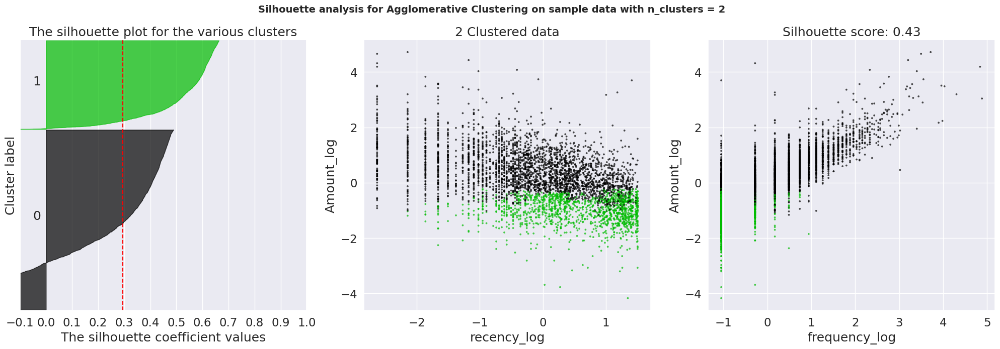

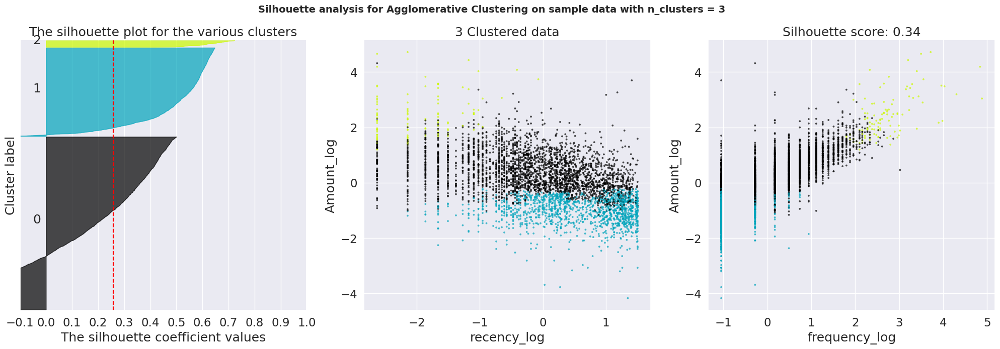

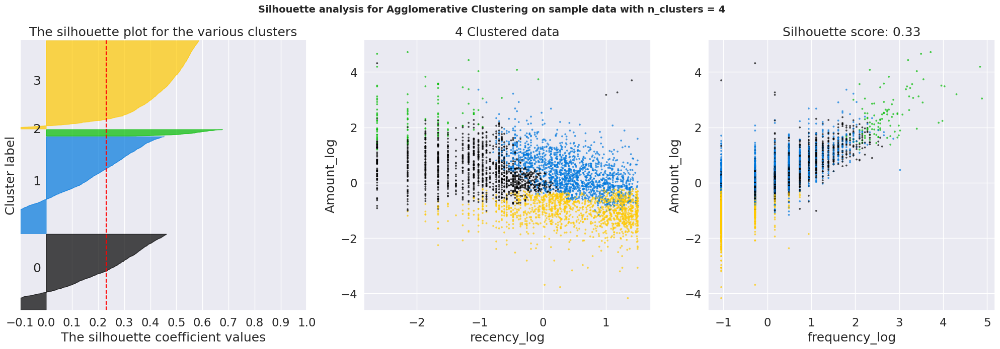

In [ ]:
cluster_centers_agg = dict()
dunn_indices_agg = []

for n_clusters in range(2, 5, 1):
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
    fig.set_size_inches(25, 7)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(X_scaled) + (n_clusters + 1) * 10])

    # Agglomerative Clustering instead of KMeans
    model_agg = AgglomerativeClustering(n_clusters=n_clusters, affinity='euclidean', linkage='complete')
    cluster_labels = model_agg.fit_predict(X_scaled)

    silhouette_avg = silhouette_score(X=X_scaled, labels=cluster_labels)

    # Calculate Dunn Index
    cluster_distances = []
    for i in range(n_clusters):
        cluster_i_points = X_scaled[cluster_labels == i]
        pairwise_dist = pairwise_distances(cluster_i_points)
        within_cluster_dist = np.mean(pairwise_dist[np.triu_indices(len(pairwise_dist), k=1)])
        cluster_distances.append(within_cluster_dist)

    max_within_cluster_dist = max(cluster_distances)
    min_between_cluster_dist = min([np.linalg.norm(c1 - c2) for c1, c2 in combinations(model_agg.children_, 2)])
    dunn_index = min_between_cluster_dist / max_within_cluster_dist

    dunn_indices_agg.append(dunn_index)

    cluster_centers_agg.update({n_clusters: {'cluster_center': None,  # Agglomerative clustering does not have explicit cluster centers
                                         'silhouette_score': silhouette_avg,
                                         'labels': cluster_labels}
                           })

    sample_silhouette_values = silhouette_samples(X=X_scaled, labels=cluster_labels)
    y_lower = 10
    for i in range(n_clusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = plt.cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10

    ax1.set_title("The silhouette plot for the various clusters")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
    ax1.set_yticks([])
    ax1.set_xticks([-0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1])

    colors = plt.cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)

    y = 0
    x = 1
    ax2.scatter(X_scaled[:, x], X_scaled[:, y], marker='.', s=30, lw=0, alpha=0.7, c=colors, edgecolor='k')
    ax2.set_title("{} Clustered data".format(n_clusters))
    ax2.set_xlabel(feature_vector[x])
    ax2.set_ylabel(feature_vector[y])

    x = 2
    ax3.scatter(X_scaled[:, x], X_scaled[:, y], marker='.', s=30, lw=0, alpha=0.7, c=colors, edgecolor='k')
    ax3.set_title("Silhouette score: {:1.2f}".format(cluster_centers[n_clusters]['silhouette_score']))
    ax3.set_xlabel(feature_vector[x])
    ax3.set_ylabel(feature_vector[y])

    plt.suptitle(("Silhouette analysis for Agglomerative Clustering on sample data with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    plt.show()

# Market Basket Analysis

### Cross Selling:

Cross-selling involves increasing sales by analyzing a customer's shopping behavior and identifying common trends and patterns shared with general shopping trends. By leveraging these insights, retailers can recommend additional products that are likely to be appealing to the customer. Often, these suggested products are bundled together with attractive offers, encouraging customers to purchase the entire bundle rather than just the initially sought item.

Our research delves into customer transactions to uncover potential complementary products to the customer's original needs. These identified additions are then presented to the customer as suggestions, with the aim of encouraging additional purchases. This approach benefits both the customer, who may discover relevant and appealing products, and the retail establishment, which can boost sales through strategic cross-selling.

In this section, we explore association rule-mining, a powerful technique for cross-selling. Specifically, we apply the concept of market basket analysis to our retail transactions dataset, seeking to reveal patterns and associations between products that can inform effective cross-selling strategies.

### Market Basket Analysis and Association Rule Mining:

### Next Steps in the Segmentation:

To enhance discovery and can further improve the quality of clustering by adding relevant features, other customer information and purchases details may be included in this dataset.

For example, but not limited to:
- New indicators, such as customer relationship time, based on the date of your first purchase of the client
- whether the customer is from abroad or not
- some group or category of product to be obtained through the SKUs
- External data vendors and use it, and so on.

Another dimension to explore can be trying out different algorithms for performing the segmentation for instance hierarchical clustering, which we explored in some of the earlier chapters. A good segmentation process will encompass all these avenues to arrive at optimal segments that provide valuable insight.

## Cross Selling

The cross selling is the ability to sell more products to a customer by analyzing the customer's shopping trends as well as general shopping trends and patterns which are in common with the customer's shopping patterns. More often than not, these recommended products would be very appealing. The retailer will often offer you a bundle of products with some attractive offer and it is highly likely that we will end up buying the bundled products instead of just the original item.

So, we research the customer transactions and find out potential additions to the customer's original needs and offer it to the customer as a suggestion in the hope and intent that they buy them benefiting both the customer as well as the retail establishment.

In this section, we explore association rule-mining, a powerful technique that can be used for cross selling, then we apply the concept of market basket analysis to our retail transactions dataset.

### Market Basket Analysis with Association Rule-Mining
![image](https://fiverr-res.cloudinary.com/images/t_main1,q_auto,f_auto/gigs/117717078/original/7cd5947def9d84483612ef9b19829323850ac9af/bulid-a-product-recommender-system-for-ur-site.jpg)
The whole concept of association rule-mining is based on the concept that customer purchase behavior has a pattern which can be exploited for selling more items to the customer in the future.

Association rule learning is a rule-based machine learning method for discovering interesting relations between variables in large databases. It is intended to identify strong rules discovered in databases using some measures of interestingness. This rule-based approach also generates new rules as it analyzes more data. The ultimate goal, assuming a large enough dataset, is to help a machine mimic the human brain's feature extraction and abstract association capabilities from new uncategorized data.

An association rule usually has the structure like below:
![image](https://wikimedia.org/api/rest_v1/media/math/render/svg/3141048979b977982202dbf7a80596f8a6b1177e)
This rule can be read in the obvious manner that when the customer bought items on the left of the rule he is likely to buy the item on the right. Following are some vital concepts pertaining to association rule-mining.
- **Itemset**: Is just a collection of one or more items that occur together in a transaction. For example, here {milk, bread} is example of an itemset.
- **Support**: is defined as number of times an itemset appears in the dataset. The support of ***X*** with respect to ***T*** is defined as the proportion of transactions ***t*** in the dataset which contains the itemset ***X***. Mathematically it is defined as:
![image](https://wikimedia.org/api/rest_v1/media/math/render/svg/1c6acacd3b17051205704b5d323c83fc737e5db1)
- **Confidence**: Confidence is an indication of how often the rule has been found to be true. It is a measure of the times the number of times a rule is found to exist in the dataset. For a rule which states { beer -> diaper } the confidence is mathematically defined as:
![image](https://wikimedia.org/api/rest_v1/media/math/render/svg/90324dedc399441696116eed3658fd17c5da4329)
- **Lift**: Lift of the rule is defined as the ratio of observed support to the support expected in the case the elements of the rule were independent. For the previous set of transactions if the rule is defined as { X -> Y }, then the lift of the rule is defined as:
![image](https://wikimedia.org/api/rest_v1/media/math/render/svg/c392e3111167b60687405dfdc7ed55f22409f4c5)
    - If the rule had a lift of 1, it would imply that the probability of occurrence of the antecedent and that of the consequent are independent of each other. When two events are independent of each other, no rule can be drawn involving those two events.
    - If the lift is > 1, that lets us know the degree to which those two occurrences are dependent on one another, and makes those rules potentially useful for predicting the consequent in future data sets.
    - If the lift is < 1, that lets us know the items are substitute to each other. This means that presence of one item has negative effect on presence of other item and vice versa.
- **Frequent itemset**: Frequent itemsets are itemsets whose support is greater than a user defined support threshold.
- **Conviction**: Is the ratio of the expected frequency that item X occurs without a item Y (that is to say, the frequency that the rule makes an incorrect prediction) if X and Y were independent divided by the observed frequency of incorrect predictions. The conviction of a rule is defined as:
![image](https://wikimedia.org/api/rest_v1/media/math/render/svg/4c2228820d6a8cb5a84bd059d53764a6b9280386)

#### Algorithms:

Some well-known algorithms are Apriori, Eclat and FP-Growth, but they only do half the job, since they are algorithms for mining frequent itemsets. Another step needs to be done after to generate rules from frequent itemsets found in a database.

The major bottleneck in any association rule-mining algorithm is the generation of frequent itemsets. If the transaction
dataset is having k unique products, then potentially we have 2<sup>k</sup> possible itemsets.


* **Apriori**:

Apriori uses a breadth-first search strategy to count the support of itemsets and uses a candidate generation function which exploits the downward closure property of support. So, the algorithm will first generate these itemsets and then proceed to finding the frequent itemsets.  For around 100 unique products the possible number of itemsets is huge, and shows up that the Apriori algorithm prohibitively computationally expensive.

* **FP Growth**:

FP stands for frequent pattern. The FP growth algorithm is superior to Apriori algorithm as it doesn't need to generate all the candidate itemsets. The FP growth algorithm uses a divide-and-conquer strategy and leverages a special data structure called the FP-tree, to find frequent itemsets without generating all itemsets. The core steps of the algorithm are as follows:
1. In the first pass, the algorithm take in the transactional database and counts occurrence of items (attribute-value pairs) in the dataset, and stores them to 'header table'.
2. In the second pass, it builds the FP-tree structure by inserting instances to represent frequent itemsets. Items in each instance have to be sorted by descending order of their frequency in the dataset, so that the tree can be processed quickly. Items in each instance that do not meet minimum coverage threshold are discarded. If many instances share most frequent items, FP-tree provides high compression close to tree root.
3. Divide this compressed representation into multiple conditional datasets such that each one is associated with a frequent pattern.
4. Mine for patterns in each such dataset so that shorter patterns can be recursively concatenated to longer patterns, hence making it more efficient.

Recursive processing of this compressed version of main dataset grows large item sets directly, instead of generating candidate items and testing them against the entire database. Growth starts from the bottom of the header table (having longest branches), by finding all instances matching given condition. New tree is created, with counts projected from the original tree corresponding to the set of instances that are conditional on the attribute, with each node getting sum of its children counts. Recursive growth ends when no individual items conditional on the attribute meet minimum support threshold, and processing continues on the remaining header items of the original FP-tree.

Once the recursive process has completed, all large item sets with minimum coverage have been found, and association rule creation begins.

In [ ]:
cs_df_copy = pd.read_csv("https://github.com/shreyss99/Customer-Segmentation-and-Market-Basket-Analysis/raw/main/cs_df_copy.csv")

In [ ]:
cs_df_copy.dtypes

InvoiceNo       object
StockCode       object
Description     object
Quantity         int64
InvoiceDate     object
UnitPrice      float64
CustomerID     float64
Country         object
dtype: object

In [ ]:
print('Check if we had negative quantity and prices at same register:',
     'No' if cs_df_copy[(cs_df_copy.Quantity<0) & (cs_df_copy.UnitPrice<0)].shape[0] == 0 else 'Yes', '\n')
print('Check how many register we have where quantity is negative',
      'and prices is 0 or vice-versa:',
      cs_df_copy[(cs_df_copy.Quantity<=0) & (cs_df_copy.UnitPrice<=0)].shape[0])
print('\nWhat is the customer ID of the registers above:',
      cs_df_copy.loc[(cs_df_copy.Quantity<=0) & (cs_df_copy.UnitPrice<=0),
                ['CustomerID']].CustomerID.unique())
print('\n% Negative Quantity: {:3.2%}'.format(cs_df_copy[(cs_df_copy.Quantity<0)].shape[0]/cs_df_copy.shape[0]))
print('\nAll register with negative quantity has Invoice start with:',
      cs_df_copy.loc[(cs_df_copy.Quantity<0) & ~(cs_df_copy.CustomerID.isnull()), 'InvoiceNo'].apply(lambda x: x[0]).unique())
print('\nSee an example of negative quantity and others related records:')
display(cs_df_copy[(cs_df_copy.CustomerID==12472) & (cs_df_copy.StockCode==22244)])
print('Check register with UnitPrice negative:')
display(cs_df_copy[(cs_df_copy.UnitPrice<0)])

Check if we had negative quantity and prices at same register: No 

Check how many register we have where quantity is negative and prices is 0 or vice-versa: 474

What is the customer ID of the registers above: [nan]

% Negative Quantity: 1.81%

All register with negative quantity has Invoice start with: ['C']

See an example of negative quantity and others related records:


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country


Check register with UnitPrice negative:


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
298874,A563186,B,Adjust bad debt,1,2011-08-12 14:51:00,-11062.06,NaN,United Kingdom
298875,A563187,B,Adjust bad debt,1,2011-08-12 14:52:00,-11062.06,NaN,United Kingdom


In [ ]:
cs_df_copy = cs_df_copy[~cs_df_copy['Description'].isnull()]

In [ ]:
cat_des_df = cs_df_copy.groupby(["StockCode","Description"]).count().reset_index()
display(cat_des_df.StockCode.value_counts()[cat_des_df.StockCode.value_counts()>1].reset_index().head())
cs_df_copy[cs_df_copy['StockCode'] == cat_des_df.StockCode.value_counts()[cat_des_df.StockCode.value_counts()>1]
      .reset_index()['index'][4]]['Description'].unique()

,index,StockCode
0,20713,8
1,23084,7
2,21830,6
3,85175,6
4,72807A,5


array(['SET/3 ROSE CANDLE IN JEWELLED BOX', 'wet pallet', 'damages',
       '???missing', 'AMAZON'], dtype=object)

#### Build Transaction Dataset

In order to perform our data in these algorithms, we must first turn them into a sales event table where each product sold will be represented by a column, having its value 1 for when it was sold in that event or zero when not. This will generate a sparse table.

In [ ]:
items = list(cs_df_copy.Description.unique())
grouped = cs_df_copy.groupby('InvoiceNo')
transaction_level = grouped.aggregate(lambda x: tuple(x)).reset_index()[['InvoiceNo','Description']]
transaction_dict = {item:0 for item in items}
output_dict = dict()
temp = dict()
for rec in transaction_level.to_dict('records'):
    invoice_num = rec['InvoiceNo']
    items_list = rec['Description']
    transaction_dict = {item:0 for item in items}
    transaction_dict.update({item:1 for item in items if item in items_list})
    temp.update({invoice_num:transaction_dict})

new = [v for k,v in temp.items()]
transaction_df = pd.DataFrame(new)

In [ ]:
transaction_df.head()

,WHITE HANGING HEART T-LIGHT HOLDER,WHITE METAL LANTERN,CREAM CUPID HEARTS COAT HANGER,KNITTED UNION FLAG HOT WATER BOTTLE,RED WOOLLY HOTTIE WHITE HEART.,SET 7 BABUSHKA NESTING BOXES,GLASS STAR FROSTED T-LIGHT HOLDER,HAND WARMER UNION JACK,HAND WARMER RED POLKA DOT,ASSORTED COLOUR BIRD ORNAMENT,...,lost??,???,"LETTER ""U"" BLING KEY RING",wet,wet boxes,????damages????,mixed up,lost,CREAM HANGING HEART T-LIGHT HOLDER,"PAPER CRAFT , LITTLE BIRDIE"
0,1,1,1,1,1,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
def prune_dataset(input_df, length_trans = 2, total_sales_perc = 0.5,
                  start_item = None, end_item = None, TopCols = None):
    if 'total_items' in input_df.columns:
        del(input_df['total_items'])
    item_count = input_df.sum().sort_values(ascending = False).reset_index()
    total_items = sum(input_df.sum().sort_values(ascending = False))
    item_count.rename(columns={item_count.columns[0]:'item_name',
                               item_count.columns[1]:'item_count'}, inplace=True)
    if TopCols:
        input_df['total_items'] = input_df[TopCols].sum(axis = 1)
        input_df = input_df[input_df.total_items >= length_trans]
        del(input_df['total_items'])
        return input_df[TopCols], item_count[item_count.item_name.isin(TopCols)]
    elif end_item > start_item:
        selected_items = list(item_count[start_item:end_item].item_name)
        input_df['total_items'] = input_df[selected_items].sum(axis = 1)
        input_df = input_df[input_df.total_items >= length_trans]
        del(input_df['total_items'])
        return input_df[selected_items],item_count[start_item:end_item]
    else:
        item_count['item_perc'] = item_count['item_count']/total_items
        item_count['total_perc'] = item_count.item_perc.cumsum()
        selected_items = list(item_count[item_count.total_perc < total_sales_perc].item_name)
        input_df['total_items'] = input_df[selected_items].sum(axis = 1)
        input_df = input_df[input_df.total_items >= length_trans]
        del(input_df['total_items'])
        return input_df[selected_items], item_count[item_count.total_perc < total_sales_perc]

In [ ]:
transaction_df.shape

(24446, 4223)

In [ ]:
transaction_df.columns

Index(['WHITE HANGING HEART T-LIGHT HOLDER', 'WHITE METAL LANTERN',
       'CREAM CUPID HEARTS COAT HANGER', 'KNITTED UNION FLAG HOT WATER BOTTLE',
       'RED WOOLLY HOTTIE WHITE HEART.', 'SET 7 BABUSHKA NESTING BOXES',
       'GLASS STAR FROSTED T-LIGHT HOLDER', 'HAND WARMER UNION JACK',
       'HAND WARMER RED POLKA DOT', 'ASSORTED COLOUR BIRD ORNAMENT',
       ...
       'lost??', '???', 'LETTER "U" BLING KEY RING', 'wet', 'wet boxes',
       '????damages????', 'mixed up', 'lost',
       'CREAM HANGING HEART T-LIGHT HOLDER', 'PAPER CRAFT , LITTLE BIRDIE'],
      dtype='object', length=4223)

In [ ]:
cs_df_copy['Amount'] = cs_df_copy.Quantity*cs_df_copy.UnitPrice

In [ ]:
import numpy as np
AmountSum = cs_df_copy.groupby(["Description"]).Amount.sum().sort_values(ascending = False)
inv = cs_df_copy[["Description", "InvoiceNo"]].groupby(["Description"]).InvoiceNo.unique().\
      agg(np.size).sort_values(ascending = False)
Top15ev = list(inv[:15].index)

In [ ]:
output_df, item_count = prune_dataset(input_df=transaction_df, length_trans=2,start_item = 0, end_item = 15)
print('Total of Sales Amount by the Top 15 Products in Sales Events (Invoice): {:.2f}'.format(AmountSum[Top15ev].sum()))
print('Number of Sales Events:', output_df.shape[0])
print('Number of Products:', output_df.shape[1])

Total of Sales Amount by the Top 15 Products in Sales Events (Invoice): 863668.27
Number of Sales Events: 5478
Number of Products: 15


In [ ]:
item_count

,item_name,item_count
0,WHITE HANGING HEART T-LIGHT HOLDER,2302
1,REGENCY CAKESTAND 3 TIER,2169
2,JUMBO BAG RED RETROSPOT,2135
3,PARTY BUNTING,1706
4,LUNCH BAG RED RETROSPOT,1607
5,ASSORTED COLOUR BIRD ORNAMENT,1467
6,SET OF 3 CAKE TINS PANTRY DESIGN,1458
7,PACK OF 72 RETROSPOT CAKE CASES,1334
8,LUNCH BAG BLACK SKULL.,1295
9,NATURAL SLATE HEART CHALKBOARD,1266


In [ ]:
output_df

,WHITE HANGING HEART T-LIGHT HOLDER,REGENCY CAKESTAND 3 TIER,JUMBO BAG RED RETROSPOT,PARTY BUNTING,LUNCH BAG RED RETROSPOT,ASSORTED COLOUR BIRD ORNAMENT,SET OF 3 CAKE TINS PANTRY DESIGN,PACK OF 72 RETROSPOT CAKE CASES,LUNCH BAG BLACK SKULL.,NATURAL SLATE HEART CHALKBOARD,POSTAGE,JUMBO BAG PINK POLKADOT,JAM MAKING SET WITH JARS,HEART OF WICKER SMALL,JUMBO STORAGE BAG SUKI
13,0,0,0,0,1,0,0,1,0,0,0,1,0,0,1
17,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
23,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0
27,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0
33,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24193,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0
24239,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0
24251,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
24327,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0


## Apriori algorithm with Pruning:

In [ ]:
def prune_dataset(input_df, length_trans = 2, total_sales_perc = 0.5,
                  start_item = None, end_item = None, TopCols = None):
    if 'total_items' in input_df.columns:
        del(input_df['total_items'])
    item_count = input_df.sum().sort_values(ascending = False).reset_index()
    total_items = sum(input_df.sum().sort_values(ascending = False))
    item_count.rename(columns={item_count.columns[0]:'item_name',
                               item_count.columns[1]:'item_count'}, inplace=True)
    if TopCols:
        input_df['total_items'] = input_df[TopCols].sum(axis = 1)
        input_df = input_df[input_df.total_items >= length_trans]
        del(input_df['total_items'])
        return input_df[TopCols], item_count[item_count.item_name.isin(TopCols)]
    elif end_item > start_item:
        selected_items = list(item_count[start_item:end_item].item_name)
        input_df['total_items'] = input_df[selected_items].sum(axis = 1)
        input_df = input_df[input_df.total_items >= length_trans]
        del(input_df['total_items'])
        return input_df[selected_items],item_count[start_item:end_item]
    else:
        item_count['item_perc'] = item_count['item_count']/total_items
        item_count['total_perc'] = item_count.item_perc.cumsum()
        selected_items = list(item_count[item_count.total_perc < total_sales_perc].item_name)
        input_df['total_items'] = input_df[selected_items].sum(axis = 1)
        input_df = input_df[input_df.total_items >= length_trans]
        del(input_df['total_items'])
        return input_df[selected_items], item_count[item_count.total_perc < total_sales_perc]

In [ ]:
import pandas as pd
from mlxtend.frequent_patterns import apriori, association_rules

# Assuming 'output_df' is your DataFrame with transaction data

# Generate frequent itemsets with a minimum support of 0.01
frequent_itemsets = apriori(output_df, min_support=0.01, use_colnames=True)

# Generate association rules with a minimum confidence of 0.6
rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.6)

# Define a custom function for the Kulczynski similarity coefficient
def kulczynski_similarity(confidence, support_A, support_B):
    return 0.5 * (confidence + support_A / support_B)

# Add the Kulczynski similarity coefficient to the association rules
rules['kulczynski_similarity'] = kulczynski_similarity(rules['confidence'], rules['antecedent support'], rules['consequent support'])

# Print the frequent itemsets and association rules with Kulczynski similarity coefficient
print("Frequent Itemsets:")
print(frequent_itemsets)
print("\nAssociation Rules:")
print(rules[['antecedents', 'consequents', 'confidence', 'kulczynski_similarity']])

Frequent Itemsets:
      support                                           itemsets
0    0.288609               (WHITE HANGING HEART T-LIGHT HOLDER)
1    0.251734                         (REGENCY CAKESTAND 3 TIER)
2    0.330595                          (JUMBO BAG RED RETROSPOT)
3    0.228733                                    (PARTY BUNTING)
4    0.254655                          (LUNCH BAG RED RETROSPOT)
..        ...                                                ...
456  0.010223  (NATURAL SLATE HEART CHALKBOARD , PACK OF 72 R...
457  0.015152  (LUNCH BAG  BLACK SKULL., JUMBO BAG PINK POLKA...
458  0.010953  (NATURAL SLATE HEART CHALKBOARD , HEART OF WIC...
459  0.011501  (LUNCH BAG  BLACK SKULL., PARTY BUNTING, PACK ...
460  0.012961  (LUNCH BAG  BLACK SKULL., JUMBO BAG PINK POLKA...

[461 rows x 2 columns]

Association Rules:
                                           antecedents  \
0                            (JUMBO BAG PINK POLKADOT)   
1                             (JUMBO STOR

In [ ]:
import pandas as pd
from mlxtend.frequent_patterns import apriori, association_rules

# Assuming 'output_df' is your DataFrame with transaction data

# Generate frequent itemsets with a minimum support of 0.01
frequent_itemsets = apriori(output_df, min_support=0.01, use_colnames=True)

# Generate association rules with a minimum confidence of 0.6
rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.6)

# Define a custom function for the Kulczynski similarity coefficient
def kulczynski_similarity(confidence, support_A, support_B):
    return 0.5 * (confidence + support_A / support_B)

# Define a custom function for the imbalance ratio
def imbalance_ratio(support_A, support_B, support_AB):
    return abs(support_A - support_B) / (support_A + support_B - support_AB)

# Add the Kulczynski similarity coefficient to the association rules
rules['kulczynski_similarity'] = kulczynski_similarity(rules['confidence'], rules['antecedent support'], rules['consequent support'])

# Add the imbalance ratio to the association rules
rules['imbalance_ratio'] = imbalance_ratio(rules['antecedent support'], rules['consequent support'], rules['support'])

# Print the frequent itemsets and association rules with Kulczynski similarity coefficient and imbalance ratio
print("Frequent Itemsets:")
print(frequent_itemsets)
print("\nAssociation Rules:")
rules[['antecedents', 'consequents', 'confidence', 'kulczynski_similarity', 'imbalance_ratio']]


Frequent Itemsets:
      support                                           itemsets
0    0.288609               (WHITE HANGING HEART T-LIGHT HOLDER)
1    0.251734                         (REGENCY CAKESTAND 3 TIER)
2    0.330595                          (JUMBO BAG RED RETROSPOT)
3    0.228733                                    (PARTY BUNTING)
4    0.254655                          (LUNCH BAG RED RETROSPOT)
..        ...                                                ...
456  0.010223  (NATURAL SLATE HEART CHALKBOARD , PACK OF 72 R...
457  0.015152  (LUNCH BAG  BLACK SKULL., JUMBO BAG PINK POLKA...
458  0.010953  (NATURAL SLATE HEART CHALKBOARD , HEART OF WIC...
459  0.011501  (LUNCH BAG  BLACK SKULL., PARTY BUNTING, PACK ...
460  0.012961  (LUNCH BAG  BLACK SKULL., JUMBO BAG PINK POLKA...

[461 rows x 2 columns]

Association Rules:


,antecedents,consequents,confidence,kulczynski_similarity,imbalance_ratio
0,(JUMBO BAG PINK POLKADOT),(JUMBO BAG RED RETROSPOT),0.749101,0.681563,0.334450
1,(JUMBO STORAGE BAG SUKI),(JUMBO BAG RED RETROSPOT),0.673713,0.637243,0.333795
2,(LUNCH BAG BLACK SKULL.),(LUNCH BAG RED RETROSPOT),0.600556,0.687016,0.173056
3,"(JUMBO BAG PINK POLKADOT, WHITE HANGING HEART ...",(JUMBO BAG RED RETROSPOT),0.709302,0.425883,0.823436
4,"(JUMBO STORAGE BAG SUKI, WHITE HANGING HEART T...",(JUMBO BAG RED RETROSPOT),0.697368,0.432616,0.791908
...,...,...,...,...,...
159,"(LUNCH BAG BLACK SKULL., PARTY BUNTING, REGEN...",(PACK OF 72 RETROSPOT CAKE CASES),0.818182,0.445377,0.915349
160,"(LUNCH BAG BLACK SKULL., REGENCY CAKESTAND 3 ...",(PARTY BUNTING),0.750000,0.408520,0.917582
161,"(PARTY BUNTING, PACK OF 72 RETROSPOT CAKE CASE...",(LUNCH BAG BLACK SKULL.),0.707865,0.395174,0.895928
162,"(LUNCH BAG BLACK SKULL., JUMBO BAG RED RETROS...",(LUNCH BAG RED RETROSPOT),0.696078,0.384598,0.906732


In [ ]:
rules.antecedents.value_counts()

(NATURAL SLATE HEART CHALKBOARD , REGENCY CAKESTAND 3 TIER, JAM MAKING SET WITH JARS)                  5
(NATURAL SLATE HEART CHALKBOARD , LUNCH BAG RED RETROSPOT, JAM MAKING SET WITH JARS)                   4
(NATURAL SLATE HEART CHALKBOARD , JUMBO BAG RED RETROSPOT, REGENCY CAKESTAND 3 TIER)                   4
(LUNCH BAG RED RETROSPOT, WHITE HANGING HEART T-LIGHT HOLDER, JAM MAKING SET WITH JARS)                3
(REGENCY CAKESTAND 3 TIER, LUNCH BAG RED RETROSPOT, JAM MAKING SET WITH JARS)                          3
                                                                                                      ..
(JUMBO BAG PINK POLKADOT, LUNCH BAG RED RETROSPOT, WHITE HANGING HEART T-LIGHT HOLDER)                 1
(NATURAL SLATE HEART CHALKBOARD , LUNCH BAG RED RETROSPOT, WHITE HANGING HEART T-LIGHT HOLDER)         1
(LUNCH BAG  BLACK SKULL., JUMBO BAG RED RETROSPOT, WHITE HANGING HEART T-LIGHT HOLDER)                 1
(PACK OF 72 RETROSPOT CAKE CASES, LUNCH BAG RED RETROSP

In [ ]:
frequent_itemsets.sort_values(by="support",ascending=False)

,support,itemsets
2,0.330595,(JUMBO BAG RED RETROSPOT)
0,0.288609,(WHITE HANGING HEART T-LIGHT HOLDER)
4,0.254655,(LUNCH BAG RED RETROSPOT)
1,0.251734,(REGENCY CAKESTAND 3 TIER)
3,0.228733,(PARTY BUNTING)
...,...,...
367,0.010040,"(LUNCH BAG RED RETROSPOT, PACK OF 72 RETROSPOT..."
403,0.010040,"(NATURAL SLATE HEART CHALKBOARD , HEART OF WIC..."
420,0.010040,"(LUNCH BAG RED RETROSPOT, NATURAL SLATE HEART ..."
425,0.010040,"(NATURAL SLATE HEART CHALKBOARD , JUMBO BAG RE..."


In [ ]:
transaction_df.to_csv("transaction_df.csv", index=False)

## FP-Growth:

In [ ]:
import pandas as pd
transaction_df = pd.read_csv("/content/transaction_df.csv")
transaction_df.shape[0]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


24446

In [ ]:
import pandas as pd
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import fpgrowth

In [ ]:
transaction_df

,WHITE HANGING HEART T-LIGHT HOLDER,WHITE METAL LANTERN,CREAM CUPID HEARTS COAT HANGER,KNITTED UNION FLAG HOT WATER BOTTLE,RED WOOLLY HOTTIE WHITE HEART.,SET 7 BABUSHKA NESTING BOXES,GLASS STAR FROSTED T-LIGHT HOLDER,HAND WARMER UNION JACK,HAND WARMER RED POLKA DOT,ASSORTED COLOUR BIRD ORNAMENT,...,???,"LETTER ""U"" BLING KEY RING",wet,wet boxes,????damages????,mixed up,lost,CREAM HANGING HEART T-LIGHT HOLDER,"PAPER CRAFT , LITTLE BIRDIE",total_items
0,1,1,1,1,1,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24441,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
24442,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
24443,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
24444,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
import pandas as pd
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import fpgrowth

# Ensure the DataFrame contains only boolean values (True/False or 0/1)
transaction_df = transaction_df.astype(bool)

# Use TransactionEncoder to transform the data to a format suitable for FP-Growth
te = TransactionEncoder()
te_ary = te.fit(transaction_df).transform(transaction_df)

# Create a new DataFrame with the transformed data and column names
fp_growth_df = pd.DataFrame(te_ary, columns=te.columns_)

# Set the minimum support threshold (e.g., 0.1 for 10%)
min_support = 0.01

# Run FP-Growth
frequent_itemsets = fpgrowth(fp_growth_df, min_support=min_support, use_colnames=True)

# Map the encoded item names back to the original item names
frequent_itemsets['itemsets'] = frequent_itemsets['itemsets'].apply(lambda x: set(transaction_df.columns[transaction_df.columns.isin(x)]))

# View the frequent itemsets
print(frequent_itemsets)

        support itemsets
0      0.169885       {}
1      0.156590       {}
2      0.152009       {}
3      0.143582       {}
4      0.137282       {}
...         ...      ...
96011  0.010022       {}
96012  0.010022       {}
96013  0.010513       {}
96014  0.010472       {}
96015  0.010472       {}

[96016 rows x 2 columns]


In [ ]:
import pandas as pd
from mlxtend.frequent_patterns import fpgrowth, association_rules

# Set the minimum support
min_support = 0.01

# Run FP-Growth
frequent_itemsets = fpgrowth(fp_growth_df, min_support=min_support, use_colnames=True)

# Filter itemsets to include only those with a minimum number of items (e.g., 2)
min_num_items = 1
frequent_itemsets = frequent_itemsets[frequent_itemsets['itemsets'].apply(len) >= min_num_items]

# Define a custom function for the Kulczynski similarity coefficient
def kulczynski_similarity(confidence, support_A, support_B):
    return 0.5 * (confidence + support_A / support_B)

# Compute association rules with a minimum confidence of 0.6
rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.6)

# Add the Kulczynski similarity coefficient to the association rules
rules['kulczynski_similarity'] = kulczynski_similarity(rules['confidence'], rules['antecedent support'], rules['consequent support'])
rules = rules[rules['kulczynski_similarity']<1]
# View the frequent itemsets and association rules with Kulczynski similarity coefficient
print("Frequent Itemsets:")
print(frequent_itemsets)
print("\nAssociation Rules:")
rules.sort_values(by='kulczynski_similarity',ascending=False)[['antecedents', 'consequents', 'antecedent support',
       'consequent support', 'support', 'confidence', 'lift',
        'kulczynski_similarity']]

Frequent Itemsets:
        support         itemsets
0      0.169885              ( )
1      0.156590              (E)
2      0.152009              (A)
3      0.143582              (R)
4      0.137282              (T)
...         ...              ...
96011  0.010022     (P, E, O, V)
96012  0.010022  (P,  , O, V, E)
96013  0.010513     (P, R,  , V)
96014  0.010472     (R, P, E, V)
96015  0.010472  (P,  , V, R, E)

[96016 rows x 2 columns]

Association Rules:


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,kulczynski_similarity
4486,"( , A)","(L, E)",0.151640,0.118956,0.109957,0.725115,6.095651,0.999937
604,"( , E)",(O),0.156345,0.127015,0.120142,0.768446,6.050057,0.999682
816000,(A),"( , E, S)",0.152009,0.118833,0.109425,0.719860,6.057728,0.999517
263,"( , A)","(I, R)",0.151640,0.119488,0.110652,0.729701,6.106902,0.999393
815986,(A),"(E, S)",0.152009,0.118915,0.109507,0.720398,6.058086,0.999346
...,...,...,...,...,...,...,...,...
1560454,"(O, N, L, R, K, C)","(I, , T)",0.016976,0.114988,0.010186,0.600000,5.217930,0.373817
1560442,"( , O, N, L, R, K, C)","(I, T)",0.016976,0.114988,0.010186,0.600000,5.217930,0.373817
1614640,"(O, L, B, A, K)","(R, E, T)",0.016649,0.115193,0.010022,0.601966,5.225728,0.373248
1614669,"( , O, L, B, A, K)","(R, E, T)",0.016649,0.115193,0.010022,0.601966,5.225728,0.373248


In [ ]:
import pandas as pd
from mlxtend.frequent_patterns import fpgrowth, association_rules

# Assuming 'transaction_df' is your DataFrame with transaction data

# Set the minimum support
min_support = 0.01

# Run FP-Growth
frequent_itemsets = fpgrowth(transaction_df, min_support=min_support, use_colnames=True)

# Filter itemsets to include only those with a minimum number of items (e.g., 2)
min_num_items = 1
frequent_itemsets = frequent_itemsets[frequent_itemsets['itemsets'].apply(len) >= min_num_items]

# Define a custom function for the Kulczynski similarity coefficient
def kulczynski_similarity(support_A, support_B, support_AB):
    return abs(support_A - support_B) / (support_A + support_B - support_AB)

# Compute association rules with a minimum confidence of 0.6
rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.6)

# Add the Kulczynski similarity coefficient to the association rules
rules['kulczynski_similarity'] = kulczynski_similarity(
    rules['antecedent support'], rules['consequent support'], rules['support']
)
rules = rules[rules['kulczynski_similarity'] < 1]

# View the frequent itemsets and association rules with Kulczynski similarity coefficient
print("Frequent Itemsets:")
print(frequent_itemsets)
print("\nAssociation Rules:")
rules[['antecedents', 'consequents', 'antecedent support',
              'consequent support', 'support', 'confidence', 'lift',
              'kulczynski_similarity']].sort_values(by='kulczynski_similarity', ascending=False)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


Frequent Itemsets:
       support                                           itemsets
0     0.094167               (WHITE HANGING HEART T-LIGHT HOLDER)
1     0.018940              (KNITTED UNION FLAG HOT WATER BOTTLE)
2     0.017794                   (RED WOOLLY HOTTIE WHITE HEART.)
3     0.015749                     (SET 7 BABUSHKA NESTING BOXES)
4     0.012926                              (WHITE METAL LANTERN)
...        ...                                                ...
1163  0.014726  (JUMBO BAG VINTAGE DOILY , JUMBO BAG RED RETRO...
1164  0.011577  (JUMBO BAG VINTAGE DOILY , JUMBO BAG VINTAGE L...
1165  0.011413  (LUNCH BAG VINTAGE DOILY , LUNCH BAG RED RETRO...
1166  0.011167  (JUMBO BAG VINTAGE DOILY , LUNCH BAG VINTAGE D...
1167  0.011086  (CHOCOLATE HOT WATER BOTTLE, HOT WATER BOTTLE ...

[1168 rows x 2 columns]

Association Rules:


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,kulczynski_similarity
53,"(JUMBO STORAGE BAG SUKI, JUMBO BAG PINK POLKAD...",(JUMBO BAG RED RETROSPOT),0.012681,0.087335,0.011004,0.867742,9.935747,0.838695
194,"(JUMBO BAG SCANDINAVIAN BLUE PAISLEY, JUMBO BA...",(JUMBO BAG RED RETROSPOT),0.013090,0.087335,0.011004,0.840625,9.625255,0.830284
89,"(JUMBO STORAGE BAG SUKI, JUMBO BAG STRAWBERRY)",(JUMBO BAG RED RETROSPOT),0.012967,0.087335,0.010022,0.772871,8.849460,0.823743
7,"(LUNCH BAG RED RETROSPOT, JUMBO BAG PINK POLKA...",(JUMBO BAG RED RETROSPOT),0.013254,0.087335,0.010227,0.771605,8.834967,0.819828
96,"(JUMBO STORAGE BAG SKULLS, JUMBO BAG PINK POLK...",(JUMBO BAG RED RETROSPOT),0.013540,0.087335,0.010431,0.770393,8.821087,0.815920
...,...,...,...,...,...,...,...,...
217,(REGENCY TEA PLATE PINK),"(REGENCY TEA PLATE GREEN , REGENCY TEA PLATE R...",0.012845,0.013172,0.010554,0.821656,62.379515,0.021164
183,"(ROSES REGENCY TEACUP AND SAUCER , GREEN REGEN...",(PINK REGENCY TEACUP AND SAUCER),0.032071,0.032766,0.022458,0.700255,21.371331,0.016409
185,(PINK REGENCY TEACUP AND SAUCER),"(ROSES REGENCY TEACUP AND SAUCER , GREEN REGEN...",0.032766,0.032071,0.022458,0.685393,21.371331,0.016409
209,(REGENCY SUGAR BOWL GREEN),(REGENCY MILK JUG PINK ),0.013867,0.013908,0.010022,0.722714,51.963127,0.002304


# Extra Work for Proof

In [ ]:
import pandas as pd
from mlxtend.frequent_patterns import fpgrowth, association_rules

# Assuming 'transaction_df' is your DataFrame with transaction data

# Define a range of minimum support values
min_support_values = [0.01, 0.02,0.03,0.04, 0.05]

# Store results
results = []

# Iterate over minimum support values
for min_support in min_support_values:
  print(min_support)
  frequent_itemsets = fpgrowth(transaction_df, min_support=min_support, use_colnames=True)
  rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.6)

  # Evaluate and store relevant metrics (e.g., number of rules, average confidence, etc.)
  num_rules = len(rules)
  avg_confidence = rules['confidence'].mean()

  results.append({'min_support': min_support, 'num_rules': num_rules, 'avg_confidence': avg_confidence})

# Convert results to a DataFrame for easy analysis
results_df = pd.DataFrame(results)

# Visualize the results (e.g., line plot or bar chart)
# Choose metrics that are relevant to your goals

# Apply the elbow method or any other technique to find an optimal min_support value
# For example, look for an "elbow" in the graph or based on domain knowledge

# Optimal min_support value
optimal_min_support = results_df.loc[results_df['num_rules'].idxmax(), 'min_support']

print(f"Optimal Min Support Value: {optimal_min_support}")


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


0.01
0.02


/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


0.03


/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


0.04


/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


0.05


/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


Optimal Min Support Value: 0.01


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py

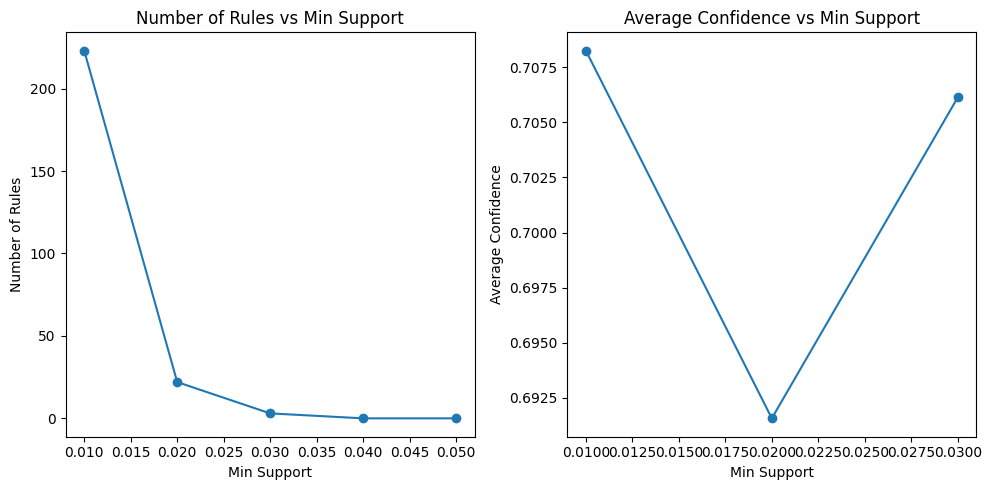

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from mlxtend.frequent_patterns import fpgrowth, association_rules

# Assuming 'transaction_df' is your DataFrame with transaction data

# Define a range of minimum support values
min_support_values = [0.01, 0.02,0.03,0.04, 0.05]

# Store results
results = []

# Iterate over minimum support values
for min_support in min_support_values:
    frequent_itemsets = fpgrowth(transaction_df, min_support=min_support, use_colnames=True)
    rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.6)

    # Evaluate and store relevant metrics
    num_rules = len(rules)
    avg_confidence = rules['confidence'].mean()

    results.append({'min_support': min_support, 'num_rules': num_rules, 'avg_confidence': avg_confidence})

# Convert results to a DataFrame for easy analysis
results_df = pd.DataFrame(results)

# Plotting
plt.figure(figsize=(10, 5))

# Plot number of rules
plt.subplot(1, 2, 1)
plt.plot(results_df['min_support'], results_df['num_rules'], marker='o')
plt.title('Number of Rules vs Min Support')
plt.xlabel('Min Support')
plt.ylabel('Number of Rules')

# Plot average confidence
plt.subplot(1, 2, 2)
plt.plot(results_df['min_support'], results_df['avg_confidence'], marker='o')
plt.title('Average Confidence vs Min Support')
plt.xlabel('Min Support')
plt.ylabel('Average Confidence')

plt.tight_layout()
plt.show()


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py

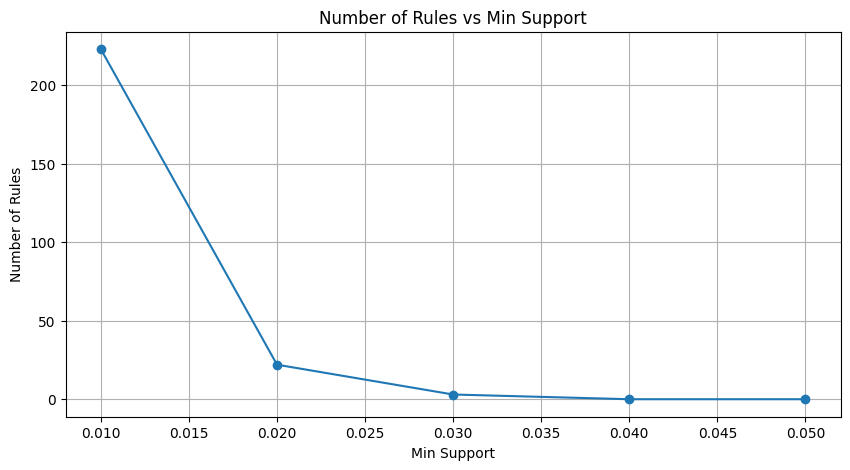

Optimal Min Support Value: 0.01


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from mlxtend.frequent_patterns import fpgrowth, association_rules

# Assuming 'transaction_df' is your DataFrame with transaction data

# Define a range of minimum support values
min_support_values = [0.01, 0.02, 0.03, 0.04, 0.05]

# Store results
results = []

# Iterate over minimum support values
for min_support in min_support_values:
    frequent_itemsets = fpgrowth(transaction_df, min_support=min_support, use_colnames=True)
    rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.6)

    # Evaluate and store relevant metrics
    num_rules = len(rules)
    avg_confidence = rules['confidence'].mean()

    results.append({'min_support': min_support, 'num_rules': num_rules, 'avg_confidence': avg_confidence})

# Convert results to a DataFrame for easy analysis
results_df = pd.DataFrame(results)

# Visualize the results
plt.figure(figsize=(10, 5))

# Plot number of rules
plt.plot(results_df['min_support'], results_df['num_rules'], marker='o')
plt.title('Number of Rules vs Min Support')
plt.xlabel('Min Support')
plt.ylabel('Number of Rules')
plt.grid(True)
plt.show()

# Optimal min_support value
optimal_min_support = results_df.loc[results_df['num_rules'].idxmax(), 'min_support']

print(f"Optimal Min Support Value: {optimal_min_support}")


In [ ]:
results_df

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,min_support,num_rules,avg_confidence
0,0.01,223,0.708262
1,0.02,22,0.691555
2,0.03,3,0.706136
3,0.04,0,NaN
4,0.05,0,NaN


In [ ]:
rules.sort_values(by="zhangs_metric",ascending=False).head()

In [ ]:
# Set the minimum support threshold (e.g., 0.1 for 10%)
min_support = 0.01

# Run FP-Growth
frequent_itemsets = fpgrowth(transaction_df, min_support=min_support, use_colnames=True)


In [ ]:
print(frequent_itemsets)


In [ ]:
import mlxtend
from mlxtend.frequent_patterns import frequent_itemsets
from mlxtend.preprocessing import OneHotEncoder
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules

In [ ]:
input_assoc_rules = output_df
# Defined the data domain by specifying each variable as a DiscreteVariable having values as (0, 1)
domain_transac = Domain([DiscreteVariable.make(name=item,values=['0', '1']) \
                         for item in input_assoc_rules.columns])

# Then using this domain, we created our Table structure for our data
data_tran = Orange.data.Table.from_numpy(domain=domain_transac, X=input_assoc_rules.values, Y=None)

# Coding our input so that the entire domain is represented as binary variables
data_tran_en, mapping = OneHot.encode(data_tran, include_class=True)

In [ ]:
data_tran_en

In [ ]:
mapping

In [ ]:
support = 0.01
print("num of required transactions = ", int(input_assoc_rules.shape[0]*support))
num_trans = input_assoc_rules.shape[0]*support
itemsets = dict(frequent_itemsets(data_tran_en, support))
print('Items Set Size:', len(itemsets))

In [ ]:
encoder = OneHotEncoder()
data_tran_en = encoder.fit_transform(data_tran)

# Set the minimum support
support = 0.01
print("Number of required transactions =", int(input_assoc_rules.shape[0] * support))

# Apply frequent itemsets mining
itemsets = frequent_itemsets(data_tran_en, min_support=support, use_colnames=True)
print('Items Set Size:', len(itemsets))

In [ ]:
import pandas as pd
from mlxtend.frequent_patterns import fpgrowth

# Sample transaction dataset (replace this with your own dataset)
data = {
    'item_A': [1, 0, 1, 0, 1],
    'item_B': [0, 1, 1, 1, 0],
    'item_C': [1, 0, 1, 0, 0],
    'item_D': [0, 1, 0, 1, 1],
}

df = pd.DataFrame(data)

# Apply FP-Growth algorithm
frequent_itemsets = fpgrowth(df, min_support=0.2, use_colnames=True)

# Display the frequent itemsets
print("Frequent Itemsets:")
print(frequent_itemsets)

Frequent Itemsets:
   support                  itemsets
0      0.6                  (item_A)
1      0.4                  (item_C)
2      0.6                  (item_D)
3      0.6                  (item_B)
4      0.2          (item_B, item_A)
5      0.2          (item_D, item_A)
6      0.4          (item_C, item_A)
7      0.2          (item_B, item_C)
8      0.2  (item_B, item_C, item_A)
9      0.4          (item_D, item_B)
